# Network variants for talk

Render each empirical SA baseline alongside SA-generated network variants. For
PUD, tobacco, and ego depletion, the notebook loads the saved networks with the
largest achieved increase and decrease in density, clustering, and degree Gini,
then writes the same figure set for each source.


In [1]:
#!pip install graphistry

In [2]:
from pathlib import Path
import sys
import json
import pickle
import random

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import pandas as pd
import seaborn as sns
import networkx as nx

PROJECT_ROOT = Path.cwd()
if not (PROJECT_ROOT / "utils").exists() and (PROJECT_ROOT / "e_network_inequality").exists():
    PROJECT_ROOT = PROJECT_ROOT / "e_network_inequality"
PROJECT_ROOT = PROJECT_ROOT.resolve()
RUN_ROOT = PROJECT_ROOT.parent if (PROJECT_ROOT.parent / "sa_variation_outputs_directed_multi").exists() else PROJECT_ROOT
FIGURE_DIR = PROJECT_ROOT / "Figures"
FIGURE_DIR.mkdir(exist_ok=True)

HIGH_RES_PNG_DPI = 600


def save_figure_with_png(fig, path, *, dpi=300, png_dpi=HIGH_RES_PNG_DPI, **savefig_kwargs):
    path = Path(path)
    png_path = path.with_suffix(".png")
    fig.savefig(path, dpi=dpi, **savefig_kwargs)
    fig.savefig(png_path, dpi=png_dpi, **savefig_kwargs)
    return {"pdf": path, "png": png_path}

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

from utils.network_plot_utils import draw_citation_graph

CMAP_CONFIG_PATH = PROJECT_ROOT / "utils" / "network_colormaps.json"
with CMAP_CONFIG_PATH.open("r", encoding="utf-8") as f:
    CMAP_CONFIG = json.load(f)

try:
    import colormaps
except Exception:
    colormaps = None

COLORMAP_FALLBACKS = {
    name: plt.get_cmap(fallback_name)
    for name, fallback_name in CMAP_CONFIG.get("fallbacks", {}).items()
}
NETWORK_COLORMAP_NAMES = dict(CMAP_CONFIG.get("network_colormaps", {}))
BASIC_NETWORK_TYPE_COLORMAP_NAMES = dict(CMAP_CONFIG.get("basic_network_type_colormaps", {}))


def resolve_colormap(name):
    if colormaps is not None:
        if hasattr(colormaps, name):
            return getattr(colormaps, name)
        if name.endswith("_r") and hasattr(colormaps, name[:-2]):
            return getattr(colormaps, name[:-2]).reversed()
    if name in COLORMAP_FALLBACKS:
        return COLORMAP_FALLBACKS[name]
    if name.endswith("_r") and name[:-2] in COLORMAP_FALLBACKS:
        return COLORMAP_FALLBACKS[name[:-2]].reversed()
    try:
        return plt.get_cmap(name)
    except ValueError:
        return plt.cm.viridis


COLORMAP = resolve_colormap(CMAP_CONFIG.get("default", "viridis"))

plt.style.use("default")
sns.set_theme(style="white")
try:
    plt.style.use("opinionated_rc")
except OSError:
    pass

# Graphistry is required for cluster-influenced FA2 layouts
import graphistry
from networkx.algorithms.community import louvain_communities

SEED = 42
random.seed(SEED)
np.random.seed(SEED)


In [3]:
import matplotlib.pyplot as plt
from matplotlib import font_manager
from pathlib import Path

try:
    plt.style.use("opinionated_rc")
except OSError:
    style_path = Path.home() / ".matplotlib/stylelib/opinionated_rc.mplstyle"
    if style_path.exists():
        plt.style.use(str(style_path))

source_sans_3_paths = [
    Path.home() / "Library/Fonts/SourceSans3-VariableFont_wght.ttf",
    Path.home() / "Library/Fonts/SourceSans3-Italic-VariableFont_wght.ttf",
]
missing_source_sans_3_paths = []
for font_path in source_sans_3_paths:
    if font_path.exists():
        font_manager.fontManager.addfont(str(font_path))
    else:
        missing_source_sans_3_paths.append(font_path)

if missing_source_sans_3_paths:
    raise FileNotFoundError(
        "Missing installed Source Sans 3 font files: "
        + ", ".join(str(path) for path in missing_source_sans_3_paths)
    )

resolved_source_sans_3 = font_manager.findfont("Source Sans 3", fallback_to_default=False)
plt.rcParams["font.family"] = ["Source Sans 3"]
plt.rcParams["font.sans-serif"] = ["Source Sans 3", *plt.rcParams.get("font.sans-serif", [])]

# Verify the renderer, not just the font file lookup.
_font_test_fig, _font_test_ax = plt.subplots(figsize=(1, 1))
_font_test_ax.set_title("Source Sans 3")
_font_test_fig.canvas.draw()
rendered_font_name = _font_test_ax.title.get_fontproperties().get_name()
plt.close(_font_test_fig)
if rendered_font_name != "Source Sans 3":
    raise RuntimeError(f"Expected Source Sans 3, but Matplotlib rendered with {rendered_font_name!r}")

print("Using font:", resolved_source_sans_3)

Using font: /Users/Noich001/Library/Fonts/SourceSans3-VariableFont_wght.ttf


## Load network baselines


In [4]:
SA_OUTPUT_DIR = PROJECT_ROOT / "sa_variation_outputs_directed_multi_v5"
SA_RESULTS_DIR = PROJECT_ROOT / "results" / "SA_approach"

NETWORK_CONFIGS = [
    {
        "key": "pud",
        "source_id": "pud_network",
        "display_name": "Peptic Ulcer",
        "title_name": "Peptic-ulcer citation network",
        "figure_slug": "pud_network",
        "single_node_alpha": 0.68,
        "single_edge_alpha": 0.40,
        "results_path": SA_RESULTS_DIR / "pud_results_sa.csv",
        "works_path": PROJECT_ROOT / "networks" / "citation_data" / "pud_works.pkl",
    },
    {
        "key": "tobacco",
        "source_id": "tobacco_network",
        "display_name": "Tobacco",
        "title_name": "Tobacco citation network",
        "figure_slug": "tobacco_network",
        "single_node_alpha": 0.68,
        "single_edge_alpha": 0.40,
        "results_path": SA_RESULTS_DIR / "tobacco_results_sa.csv",
        "works_path": PROJECT_ROOT / "networks" / "citation_data" / "tobacco_works.pkl",
    },
    {
        "key": "ego_depletion",
        "source_id": "ego_network",
        "display_name": "Ego Depletion",
        "title_name": "Ego-depletion citation network",
        "figure_slug": "ego_depletion_network",
        "single_node_alpha": 0.50,
        "single_edge_alpha": 0.28,
        "results_path": SA_RESULTS_DIR / "ego_depletion_results_sa.csv",
        "works_path": PROJECT_ROOT / "networks" / "citation_data" / "ego_works.pkl",
    },
]


def load_network_state(config):
    config = dict(config)
    baseline_path = SA_OUTPUT_DIR / "baselines" / f"{config['source_id']}_normalized_baseline.pkl"
    with baseline_path.open("rb") as f:
        baseline_graph = pickle.load(f)

    config["colormap_name"] = config.get(
        "colormap_name",
        NETWORK_COLORMAP_NAMES.get(config["key"], CMAP_CONFIG.get("default", "viridis")),
    )
    config["colormap"] = resolve_colormap(config["colormap_name"])
    config["baseline_path"] = baseline_path
    config["G_original"] = baseline_graph
    config["sa_results"] = pd.read_csv(config["results_path"])
    return config


network_states = [load_network_state(config) for config in NETWORK_CONFIGS]
network_state_by_key = {state["key"]: state for state in network_states}
network_state_by_source = {state["source_id"]: state for state in network_states}

current_state = network_states[0]
G_original = current_state["G_original"]

for state in network_states:
    G = state["G_original"]
    print(
        f"{state['display_name']}: {G.number_of_nodes():,} nodes, "
        f"{G.number_of_edges():,} edges | cmap={state['colormap_name']} | "
        f"baseline={state['baseline_path']}"
    )


Peptic Ulcer: 90 nodes, 160 edges | cmap=oryel_r | baseline=/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/sa_variation_outputs_directed_multi_v5/baselines/pud_network_normalized_baseline.pkl
Tobacco: 289 nodes, 1,229 edges | cmap=teal_r | baseline=/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/sa_variation_outputs_directed_multi_v5/baselines/tobacco_network_normalized_baseline.pkl
Ego Depletion: 503 nodes, 2,933 edges | cmap=redp1 | baseline=/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/sa_variation_outputs_directed_multi_v5/baselines/ego_network_normalized_baseline.pkl


## Optional: attach average publication year metadata

If a network-specific metadata CSV exists, it is loaded automatically. The
current checkout does not need metadata for these comparison figures; without it,
nodes render in a flat color.


In [5]:
RUN_OPENALEX = False


def _author_year_frame_from_works(works_path):
    with Path(works_path).open("rb") as f:
        works = pickle.load(f)

    author_years = {}
    for work in works:
        if not isinstance(work, dict):
            continue
        year = work.get("publication_year")
        if pd.isna(year):
            continue
        year = int(year)
        for authorship in work.get("authorships") or []:
            author = authorship.get("author") or {}
            author_id = author.get("id")
            if author_id:
                author_years.setdefault(author_id, []).append(year)

    rows = []
    for author_id, years in author_years.items():
        rows.append(
            {
                "author_id": author_id,
                "avg_publication_year": float(np.mean(years)),
                "first_publication_year": int(np.min(years)),
                "last_publication_year": int(np.max(years)),
                "works_with_year": len(years),
            }
        )
    return pd.DataFrame(rows)


def attach_author_year_metadata(state):
    G = state["G_original"]
    meta_path = state.get("metadata_path")

    if meta_path is not None:
        meta_path = Path(meta_path)
        if not meta_path.exists():
            print(f"{state['display_name']}: metadata not found at {meta_path}; trying works file.")
        else:
            df_avg = pd.read_csv(meta_path)
            if "author_id" in df_avg.columns and "avg_pub_year_pre1978" in df_avg.columns:
                df_avg = df_avg.copy()
                df_avg["author_id"] = df_avg["author_id"].astype(str).map(
                    lambda x: x if x.startswith("https://openalex.org/") else f"https://openalex.org/{x}"
                )
                df_avg["avg_publication_year"] = df_avg["avg_pub_year_pre1978"]
                df_avg["works_with_year"] = df_avg.get("works_pre1978", np.nan)
            else:
                print(f"{state['display_name']}: metadata file lacks expected year columns; trying works file.")
                df_avg = None
            if df_avg is not None:
                return _attach_author_year_frame(state, df_avg, source_label=str(meta_path))

    works_path = state.get("works_path")
    if works_path is None:
        print(f"{state['display_name']}: no works path configured; flat node color.")
        return None

    works_path = Path(works_path)
    if not works_path.exists():
        print(f"{state['display_name']}: works file not found at {works_path}; flat node color.")
        return None

    df_avg = _author_year_frame_from_works(works_path)
    return _attach_author_year_frame(state, df_avg, source_label=str(works_path))


def _attach_author_year_frame(state, df_avg, source_label):
    G = state["G_original"]
    df_avg = df_avg.copy()
    df_avg["author_id"] = df_avg["author_id"].astype(str)

    year_cols = [
        "avg_publication_year",
        "first_publication_year",
        "last_publication_year",
        "works_with_year",
    ]
    attached = 0
    for _, row in df_avg.iterrows():
        author_id = row["author_id"]
        if author_id not in G:
            continue
        for col in year_cols:
            if col in row and pd.notna(row[col]):
                G.nodes[author_id][col] = row[col]
        # Backward-compatible alias for older scratch cells in this notebook.
        G.nodes[author_id]["avg_pub_year_pre1978"] = G.nodes[author_id].get("avg_publication_year", np.nan)
        attached += 1

    values = np.array(
        [G.nodes[n].get("avg_publication_year", np.nan) for n in G.nodes()],
        dtype=float,
    )
    finite = values[np.isfinite(values)]
    if len(finite):
        print(
            f"{state['display_name']}: attached publication years to {attached}/{G.number_of_nodes()} nodes "
            f"from {source_label}; mean-year range {finite.min():.1f}-{finite.max():.1f}."
        )
    else:
        print(f"{state['display_name']}: no graph nodes matched publication years from {source_label}.")
    return df_avg


metadata_frames = {
    state["key"]: attach_author_year_metadata(state)
    for state in network_states
}


Peptic Ulcer: attached publication years to 90/90 nodes from /Users/Noich001/Desktop/network_inequality_current/e_network_inequality/networks/citation_data/pud_works.pkl; mean-year range 1949.0-1978.0.
Tobacco: attached publication years to 289/289 nodes from /Users/Noich001/Desktop/network_inequality_current/e_network_inequality/networks/citation_data/tobacco_works.pkl; mean-year range 1924.0-1964.0.
Ego Depletion: attached publication years to 503/503 nodes from /Users/Noich001/Desktop/network_inequality_current/e_network_inequality/networks/citation_data/ego_works.pkl; mean-year range 2003.0-2016.0.


In [6]:
current_state["G_original"].nodes(data=True)


NodeDataView({'https://openalex.org/A5000129920': {'n_works': 1, 'original_label': 'https://openalex.org/A5000129920', 'avg_publication_year': 1978.0, 'first_publication_year': 1978, 'last_publication_year': 1978, 'works_with_year': 1, 'avg_pub_year_pre1978': 1978.0}, 'https://openalex.org/A5002677733': {'n_works': 1, 'original_label': 'https://openalex.org/A5002677733', 'avg_publication_year': 1963.0, 'first_publication_year': 1963, 'last_publication_year': 1963, 'works_with_year': 1, 'avg_pub_year_pre1978': 1963.0}, 'https://openalex.org/A5002947675': {'n_works': 1, 'original_label': 'https://openalex.org/A5002947675', 'avg_publication_year': 1975.0, 'first_publication_year': 1975, 'last_publication_year': 1975, 'works_with_year': 1, 'avg_pub_year_pre1978': 1975.0}, 'https://openalex.org/A5005156349': {'n_works': 1, 'original_label': 'https://openalex.org/A5005156349', 'avg_publication_year': 1968.0, 'first_publication_year': 1968, 'last_publication_year': 1968, 'works_with_year': 1,

In [7]:
# Quick sanity check for one author id in all loaded baselines.
target_author = "https://openalex.org/A5113573464"
for state in network_states:
    G = state["G_original"]
    if target_author in G.nodes:
        print(f"{state['display_name']}: {target_author} is in the network")
        print(f"Node data: {G.nodes[target_author]}")
    else:
        print(f"{state['display_name']}: {target_author} is NOT in the network")


Peptic Ulcer: https://openalex.org/A5113573464 is NOT in the network
Tobacco: https://openalex.org/A5113573464 is NOT in the network
Ego Depletion: https://openalex.org/A5113573464 is NOT in the network


## Helpers


In [8]:
import matplotlib.colors as mcolors

HAMMER_PARAMS = {
    "accuracy": 500,
    "advect_iterations": 50,
    "batch_size": 20000,
    "decay": 0.009,
    "initial_bandwidth": 1.2,
    "iterations": 6,
    "max_segment_length": 0.016,
    "min_segment_length": 0.008,
    "tension": 1.4,
}


def _layout_seed_from_position_df(node_order, position_df):
    missing_nodes = [node for node in node_order if node not in position_df.index]
    if missing_nodes:
        raise ValueError(
            f"Initial layout is missing {len(missing_nodes)} of {len(node_order)} nodes. "
            "Cannot continue the layout from those positions."
        )
    return position_df.loc[node_order, ["x", "y"]].to_numpy(dtype=float).tolist()


def compute_cluster_layout(G, seed=SEED, niter=10000, initial_position_df=None, start_temp=None):
    comms = louvain_communities(G, seed=seed)
    cluster = {n: i for i, c in enumerate(comms) for n in c}
    nx.set_node_attributes(G, cluster, "cluster")

    g = graphistry.bind(source="src", destination="dst").from_networkx(G)
    g_layout = g.modularity_weighted_layout(
        community_col="cluster",
        cross_community_weight=0.1,
        same_community_weight=5,
    )

    layout_params = {"weights": "weight", "niter": niter}
    if start_temp is not None:
        layout_params["start_temp"] = start_temp
    if initial_position_df is not None:
        node_order = pd.DataFrame(g_layout.__dict__["_nodes"])["n"].tolist()
        layout_params["seed"] = _layout_seed_from_position_df(node_order, initial_position_df)

    g_layout = g_layout.layout_igraph("fr", directed=False, params=layout_params)
    position_df = pd.DataFrame(g_layout.__dict__["_nodes"]).set_index("n")
    return position_df


def spring_layout_df(G, seed=SEED):
    pos = nx.spring_layout(G, seed=seed)
    return pd.DataFrame.from_dict(pos, orient="index", columns=["x", "y"])


def _tighten_axis_limits(ax, xy, pad_fraction=0.015):
    xmin, ymin = xy.min(axis=0)
    xmax, ymax = xy.max(axis=0)
    xpad = max((xmax - xmin) * pad_fraction, 1e-9)
    ypad = max((ymax - ymin) * pad_fraction, 1e-9)
    ax.set_xlim(xmin - xpad, xmax + xpad)
    ax.set_ylim(ymin - ypad, ymax + ypad)


def plot_network_panel(
    ax,
    G,
    position_df,
    title,
    *,
    cmap=None,
    norm=None,
    year_attr="avg_publication_year",
    min_year=None,
    show_colorbar=False,
    title_y=1.0,
    title_fontsize=8,
    title_fontweight="semibold",
    title_loc="left",
    title_pad=1,
    node_size_scale=4.0,
    node_size_min=0.5,
    node_alpha=0.5,
    edge_alpha=0.24,
    edge_linewidths=0.4,
    axis_pad=0.015,
    colorbar_shrink=0.6,
    colorbar_fraction=0.046,
    colorbar_pad=0.04,
    colorbar_orientation="vertical",
    colorbar_cax=None,
    colorbar_tick_labelsize=None,
):
    if cmap is None:
        cmap = COLORMAP

    node_ids = list(G.nodes())
    missing_nodes = [node for node in node_ids if node not in position_df.index]
    if missing_nodes:
        print(
            f"Layout missing {len(missing_nodes)} of {len(node_ids)} nodes for '{title}'. "
            "Using a deterministic spring layout for this panel."
        )
        position_df = spring_layout_df(G)

    xy = position_df.loc[node_ids, ["x", "y"]].to_numpy()
    degrees = np.array([G.degree(n) for n in node_ids])
    node_sizes = degrees * node_size_scale + node_size_min
    color_values = np.array(
        [G.nodes[n].get(year_attr, np.nan) for n in node_ids], dtype=float
    )
    if min_year is not None:
        color_values = np.where(np.isfinite(color_values), np.clip(color_values, min_year, None), np.nan)

    if np.isfinite(color_values).any():
        edge_norm = norm
        if edge_norm is None:
            finite = color_values[np.isfinite(color_values)]
            vmin = float(np.nanmin(finite))
            vmax = float(np.nanmax(finite))
            if vmax <= vmin:
                vmax = vmin + 1.0
            edge_norm = plt.Normalize(vmin=vmin, vmax=vmax)
        bundled_node_colors = [
            mcolors.to_hex(cmap(edge_norm(value))) if np.isfinite(value) else "#d9d9d9"
            for value in color_values
        ]
    else:
        # Fallback only: if publication years are unavailable, color bundled edges by degree.
        edge_color_values = degrees.astype(float)
        if np.nanmax(edge_color_values) > np.nanmin(edge_color_values):
            edge_norm = plt.Normalize(
                vmin=float(np.nanmin(edge_color_values)),
                vmax=float(np.nanmax(edge_color_values)),
            )
            bundled_node_colors = [mcolors.to_hex(cmap(edge_norm(value))) for value in edge_color_values]
        else:
            bundled_node_colors = ["#d9d9d9" for _ in edge_color_values]

    for node, (x, y), color in zip(node_ids, xy, bundled_node_colors):
        G.nodes[node]["X"] = x
        G.nodes[node]["Y"] = y
        G.nodes[node]["color"] = color

    draw_citation_graph(
        G,
        ax=ax,
        bundle_edges=True,
        alpha=edge_alpha,
        linewidths=edge_linewidths,
        hammer_kwargs=HAMMER_PARAMS,
    )

    if np.isfinite(color_values).any():
        ax.scatter(
            xy[:, 0],
            xy[:, 1],
            s=node_sizes,
            c=color_values,
            cmap=cmap,
            norm=norm,
            alpha=node_alpha,
            linewidth=0.3,
            zorder=2,
        )
        if show_colorbar and norm is not None:
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            colorbar_kwargs = {"orientation": colorbar_orientation}
            if colorbar_cax is None:
                colorbar_kwargs.update(
                    {
                        "ax": ax,
                        "shrink": colorbar_shrink,
                        "fraction": colorbar_fraction,
                        "pad": colorbar_pad,
                    }
                )
            else:
                colorbar_kwargs["cax"] = colorbar_cax
            cbar = plt.colorbar(sm, **colorbar_kwargs)
            if colorbar_tick_labelsize is not None:
                cbar.ax.tick_params(labelsize=colorbar_tick_labelsize)
    else:
        ax.scatter(
            xy[:, 0],
            xy[:, 1],
            s=node_sizes,
            c="lightgray",
            alpha=node_alpha,
            linewidth=0.3,
            zorder=2,
        )
        if show_colorbar and colorbar_cax is not None:
            colorbar_cax.axis("off")

    _tighten_axis_limits(ax, xy, pad_fraction=axis_pad)
    ax.set_anchor("C")
    ax.set_title(
        title,
        y=title_y,
        fontsize=title_fontsize,
        fontweight=title_fontweight,
        loc=title_loc,
        pad=title_pad,
        linespacing=1.0,
    )
    ax.axis("off")


## Load SA-generated variants


In [9]:
TARGET_STATS = ["density", "clustering", "degree_gini"]
TARGET_STAT_LABELS = {
    "density": "Density",
    "clustering": "Clustering",
    "degree_gini": "Degree Gini",
}
DIRECTION_LABELS = {
    "increase": "increased",
    "decrease": "decreased",
}


def resolve_sa_graph_path(row):
    candidates = []
    for column in ["network_path", "sa_saved_graph_path"]:
        raw = row.get(column)
        if pd.isna(raw):
            continue
        raw = str(raw)
        path = Path(raw).expanduser()
        candidates.append(path)
        candidates.append(PROJECT_ROOT / raw)
        candidates.append(RUN_ROOT / raw)

        marker = "sa_variation_outputs_directed_multi_v2/"
        if marker in raw:
            candidates.append(SA_OUTPUT_DIR / raw.split(marker, 1)[1])

        if raw.startswith("NetworkInequality/"):
            candidates.append(RUN_ROOT / raw.replace("NetworkInequality/", "", 1))
            candidates.append(PROJECT_ROOT / raw)

    for candidate in candidates:
        if candidate.exists():
            return candidate.resolve()

    raise FileNotFoundError(f"Could not locate saved SA graph for row: {row.to_dict()}")


def _prepared_sa_subset(results_df, source_id, target_stat):
    subset = results_df.loc[results_df["sa_target_stat"].eq(target_stat)].copy()
    if "sa_source_id" in subset.columns:
        subset = subset.loc[subset["sa_source_id"].eq(source_id)].copy()
    if subset.empty:
        raise ValueError(f"No SA rows found for source={source_id!r}, target_stat={target_stat!r}")

    if "sa_feasible" in subset.columns:
        feasible = subset["sa_feasible"].astype(str).str.lower().isin(["true", "1"])
        subset = subset.loc[feasible].copy()

    achieved_col = f"sa_achieved_{target_stat}"
    baseline_col = f"sa_baseline_{target_stat}"
    subset["target_delta"] = (
        pd.to_numeric(subset[achieved_col], errors="coerce")
        - pd.to_numeric(subset[baseline_col], errors="coerce")
    )
    subset["target_delta_abs"] = subset["target_delta"].abs()
    subset["sa_edit_distance_numeric"] = pd.to_numeric(
        subset.get("sa_edit_distance"), errors="coerce"
    )
    subset = subset.dropna(subset=["target_delta"])
    if subset.empty:
        raise ValueError(f"No numeric SA rows found for source={source_id!r}, target_stat={target_stat!r}")
    return subset


def select_min_max_sa_variants(results_df, source_id, target_stats=TARGET_STATS):
    selected_rows = []
    for target_stat in target_stats:
        subset = _prepared_sa_subset(results_df, source_id, target_stat)

        max_row = subset.sort_values(
            ["target_delta", "sa_edit_distance_numeric"],
            ascending=[False, True],
        ).iloc[0].copy()
        max_row["target_direction"] = "increase"

        min_row = subset.sort_values(
            ["target_delta", "sa_edit_distance_numeric"],
            ascending=[True, True],
        ).iloc[0].copy()
        min_row["target_direction"] = "decrease"

        selected_rows.extend([max_row, min_row])

    return pd.DataFrame(selected_rows)


def copy_node_attributes(source_graph, target_graph):
    for node, attrs in source_graph.nodes(data=True):
        if node in target_graph:
            target_graph.nodes[node].update(attrs)


def format_variant_label(row, panel_letter=None):
    prefix = f"{panel_letter}) " if panel_letter is not None else ""
    target_label = TARGET_STAT_LABELS[row["sa_target_stat"]]
    direction_label = DIRECTION_LABELS[row["target_direction"]]
    return (
        f"{prefix}{target_label} {direction_label}\n"
        f"D={row['sa_achieved_density']:.4f}  "
        f"C={row['sa_achieved_clustering']:.3f}  "
        f"G={row['sa_achieved_degree_gini']:.3f}"
    )


def prepare_network_variants(state):
    G_original = state["G_original"].copy()
    selected = select_min_max_sa_variants(state["sa_results"], state["source_id"])

    G_variants = []
    variant_records = []
    for idx, (_, row) in enumerate(selected.iterrows()):
        graph_path = resolve_sa_graph_path(row)
        with graph_path.open("rb") as f:
            G_variant = pickle.load(f)
        copy_node_attributes(G_original, G_variant)

        row = row.copy()
        row["resolved_graph_path"] = str(graph_path)
        for metric in ["density", "clustering", "degree_gini"]:
            row[f"sa_achieved_{metric}"] = float(row[f"sa_achieved_{metric}"])
            row[f"sa_baseline_{metric}"] = float(row[f"sa_baseline_{metric}"])
        row["target_delta"] = float(row["target_delta"])
        row["target_delta_abs"] = abs(row["target_delta"])

        panel_letter = chr(ord("b") + idx)
        label = format_variant_label(row, panel_letter)
        short_label = f"{TARGET_STAT_LABELS[row['sa_target_stat']]} {DIRECTION_LABELS[row['target_direction']]}"
        record = {
            "label": label,
            "short_label": short_label,
            "graph": G_variant,
            "row": row,
            "target_stat": row["sa_target_stat"],
            "direction": row["target_direction"],
        }
        G_variants.append((label, G_variant))
        variant_records.append(record)

    selected = pd.DataFrame([record["row"] for record in variant_records])
    state["G_original"] = G_original
    state["selected_sa_variants"] = selected
    state["G_variants"] = G_variants
    state["variant_records"] = variant_records
    return state


for state in network_states:
    prepare_network_variants(state)

# Backwards-compatible aliases for downstream scratch cells.
current_state = network_states[0]
G_original = current_state["G_original"]
selected_sa_variants = current_state["selected_sa_variants"]
G_variants = current_state["G_variants"]
variant_records = current_state["variant_records"]

pd.concat(
    [
        state["selected_sa_variants"].assign(network=state["display_name"])
        for state in network_states
    ],
    ignore_index=True,
)[[
    "network",
    "sa_target_stat",
    "target_direction",
    "target_delta",
    "sa_target_value_requested",
    "sa_achieved_density",
    "sa_achieved_clustering",
    "sa_achieved_degree_gini",
    "sa_baseline_density",
    "sa_baseline_clustering",
    "sa_baseline_degree_gini",
    "sa_edit_distance",
    "resolved_graph_path",
]]


,network,sa_target_stat,target_direction,target_delta,sa_target_value_requested,sa_achieved_density,sa_achieved_clustering,sa_achieved_degree_gini,sa_baseline_density,sa_baseline_clustering,sa_baseline_degree_gini,sa_edit_distance,resolved_graph_path
0,Peptic Ulcer,density,increase,0.010112,0.029963,0.030087,0.370301,0.724620,0.019975,0.370253,0.724583,81.0,/Users/Noich001/Desktop/network_inequality_cur...
1,Peptic Ulcer,density,decrease,-0.006742,0.013216,0.013233,0.370370,0.724528,0.019975,0.370253,0.724583,54.0,/Users/Noich001/Desktop/network_inequality_cur...
2,Peptic Ulcer,clustering,increase,0.095025,0.462816,0.019975,0.465278,0.724583,0.019975,0.370253,0.724583,16.0,/Users/Noich001/Desktop/network_inequality_cur...
3,Peptic Ulcer,clustering,decrease,-0.093524,0.279560,0.019975,0.276730,0.724583,0.019975,0.370253,0.724583,8.0,/Users/Noich001/Desktop/network_inequality_cur...
4,Peptic Ulcer,degree_gini,increase,0.142361,0.869500,0.019975,0.370262,0.866944,0.019975,0.370253,0.724583,86.0,/Users/Noich001/Desktop/network_inequality_cur...
5,Peptic Ulcer,degree_gini,decrease,-0.144028,0.582594,0.019975,0.370242,0.580556,0.019975,0.370253,0.724583,42.0,/Users/Noich001/Desktop/network_inequality_cur...
6,Tobacco,density,increase,0.007389,0.022149,0.022155,0.299225,0.761313,0.014766,0.299225,0.761313,615.0,/Users/Noich001/Desktop/network_inequality_cur...
7,Tobacco,density,decrease,-0.007377,0.007383,0.007389,0.299229,0.761313,0.014766,0.299225,0.761313,614.0,/Users/Noich001/Desktop/network_inequality_cur...
8,Tobacco,clustering,increase,0.072345,0.374031,0.014766,0.371569,0.761313,0.014766,0.299225,0.761313,112.0,/Users/Noich001/Desktop/network_inequality_cur...
9,Tobacco,clustering,decrease,-0.072016,0.224418,0.014766,0.227208,0.761313,0.014766,0.299225,0.761313,54.0,/Users/Noich001/Desktop/network_inequality_cur...


## Compute layout


In [10]:
ORIGINAL_LAYOUT_NITER = 10000
DERIVATIVE_LAYOUT_NITER = 100
DERIVATIVE_LAYOUT_START_TEMP = 0.02


def prepare_layouts_for_state(state):
    layout_original = compute_cluster_layout(
        state["G_original"],
        niter=ORIGINAL_LAYOUT_NITER,
    )
    state["layout_original"] = layout_original
    state["_layout_cache"] = {"original": layout_original}
    state["_variant_layout_cache"] = {}

    color_values = np.array(
        [state["G_original"].nodes[n].get("avg_publication_year", np.nan) for n in state["G_original"].nodes()],
        dtype=float,
    )
    finite = color_values[np.isfinite(color_values)]
    if len(finite):
        vmin = float(np.nanmin(finite))
        vmax = float(np.nanmax(finite))
        if vmax <= vmin:
            vmax = vmin + 1.0
        state["color_norm"] = plt.Normalize(vmin=vmin, vmax=vmax)
    else:
        state["color_norm"] = None
    return state


def align_layout_to_reference(position_df, reference_df, min_nodes=3):
    common_nodes = position_df.index.intersection(reference_df.index)
    if len(common_nodes) < min_nodes:
        return position_df

    moving = position_df.loc[common_nodes, ["x", "y"]].to_numpy(dtype=float)
    target = reference_df.loc[common_nodes, ["x", "y"]].to_numpy(dtype=float)
    moving_mean = moving.mean(axis=0)
    target_mean = target.mean(axis=0)
    moving_centered = moving - moving_mean
    target_centered = target - target_mean
    denom = np.sum(moving_centered ** 2)
    if denom <= 0:
        return position_df

    u, singular_values, vt = np.linalg.svd(moving_centered.T @ target_centered)
    rotation = u @ vt
    scale = singular_values.sum() / denom

    aligned = position_df.copy()
    xy = aligned[["x", "y"]].to_numpy(dtype=float)
    aligned[["x", "y"]] = (xy - moving_mean) @ rotation * scale + target_mean
    return aligned


def _variant_layout_cache_key(record):
    row = record["row"]
    return (
        record["target_stat"],
        record["direction"],
        str(row.get("resolved_graph_path", "")),
    )


def layout_for_graph_for_state(
    state,
    G,
    *,
    continue_from_original=False,
    cache_key=None,
    layout_label=None,
    niter=DERIVATIVE_LAYOUT_NITER,
    start_temp=DERIVATIVE_LAYOUT_START_TEMP,
):
    if G is state["G_original"]:
        return state["layout_original"]

    if continue_from_original:
        base_cache_key = cache_key if cache_key is not None else ("continued", id(G))
        cache_key = (base_cache_key, niter, start_temp)
        if cache_key not in state["_variant_layout_cache"]:
            original_nodes = set(state["layout_original"].index)
            graph_nodes = set(G.nodes())
            if graph_nodes == original_nodes:
                label_text = f" for {layout_label}" if layout_label else " for derivative graph"
                print(
                    f"{state['display_name']}: continuing layout{label_text} "
                    f"from original positions ({niter} FR iterations, start_temp={start_temp})."
                )
                variant_layout = compute_cluster_layout(
                    G,
                    niter=niter,
                    initial_position_df=state["layout_original"],
                    start_temp=start_temp,
                )
                state["_variant_layout_cache"][cache_key] = align_layout_to_reference(
                    variant_layout,
                    state["layout_original"],
                )
            else:
                print(
                    f"{state['display_name']}: derivative graph has a different node set; "
                    "computing an unseeded layout instead."
                )
                state["_variant_layout_cache"][cache_key] = compute_cluster_layout(
                    G,
                    niter=ORIGINAL_LAYOUT_NITER,
                )
        return state["_variant_layout_cache"][cache_key]

    graph_key = ("unseeded", frozenset(G.nodes()))
    if graph_key not in state["_layout_cache"]:
        print(f"{state['display_name']}: computing a separate unseeded layout for a graph with {G.number_of_nodes()} nodes.")
        state["_layout_cache"][graph_key] = compute_cluster_layout(
            G,
            niter=ORIGINAL_LAYOUT_NITER,
        )
    return state["_layout_cache"][graph_key]


def layout_for_record_for_state(
    state,
    record,
    *,
    niter=DERIVATIVE_LAYOUT_NITER,
    start_temp=DERIVATIVE_LAYOUT_START_TEMP,
):
    return layout_for_graph_for_state(
        state,
        record["graph"],
        continue_from_original=True,
        cache_key=_variant_layout_cache_key(record),
        layout_label=record["short_label"],
        niter=niter,
        start_temp=start_temp,
    )


for state in network_states:
    prepare_layouts_for_state(state)

# Backwards-compatible aliases for downstream scratch cells.
current_state = network_states[0]
layout_original = current_state["layout_original"]
_LAYOUT_CACHE = current_state["_layout_cache"]
_VARIANT_LAYOUT_CACHE = current_state["_variant_layout_cache"]
COLOR_NORM = current_state["color_norm"]


def layout_for_graph(G, *, continue_from_original=None, start_temp=DERIVATIVE_LAYOUT_START_TEMP):
    if continue_from_original is None:
        continue_from_original = G is not current_state["G_original"]
    return layout_for_graph_for_state(
        current_state,
        G,
        continue_from_original=continue_from_original,
        start_temp=start_temp,
    )


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs
edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs
edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


## Facet plot


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Peptic Ulcer: continuing layout for Density increased from original positions (100 FR iterations, start_temp=0.02).


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs
edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs
edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Peptic Ulcer: continuing layout for Density decreased from original positions (100 FR iterations, start_temp=0.02).
Peptic Ulcer: continuing layout for Clustering increased from original positions (100 FR iterations, start_temp=0.02).
Peptic Ulcer: continuing layout for Clustering decreased from original positions (100 FR iterations, start_temp=0.02).


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs
edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Peptic Ulcer: continuing layout for Degree Gini increased from original positions (100 FR iterations, start_temp=0.02).
Peptic Ulcer: continuing layout for Degree Gini decreased from original positions (100 FR iterations, start_temp=0.02).


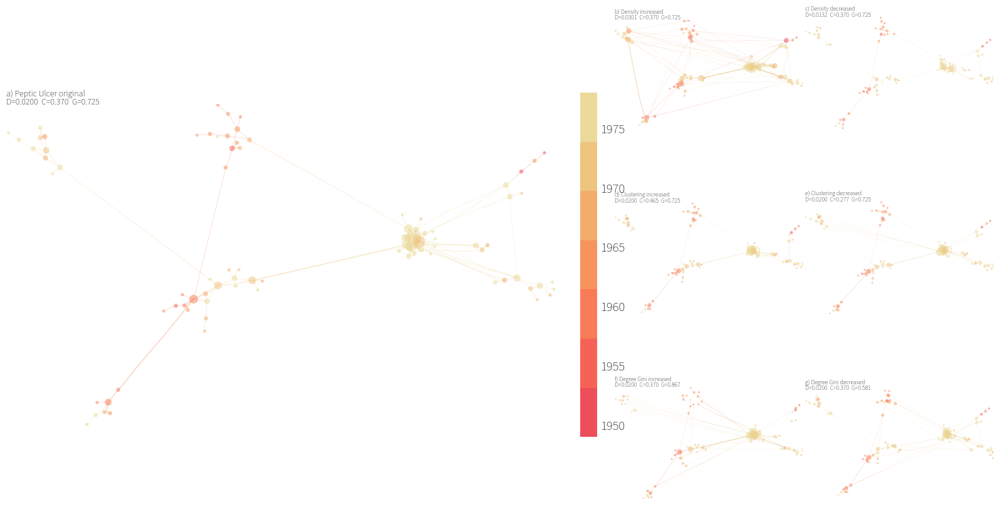

edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Tobacco: continuing layout for Density increased from original positions (100 FR iterations, start_temp=0.02).


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Tobacco: continuing layout for Density decreased from original positions (100 FR iterations, start_temp=0.02).


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Tobacco: continuing layout for Clustering increased from original positions (100 FR iterations, start_temp=0.02).


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Tobacco: continuing layout for Clustering decreased from original positions (100 FR iterations, start_temp=0.02).


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Tobacco: continuing layout for Degree Gini increased from original positions (100 FR iterations, start_temp=0.02).


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Tobacco: continuing layout for Degree Gini decreased from original positions (100 FR iterations, start_temp=0.02).


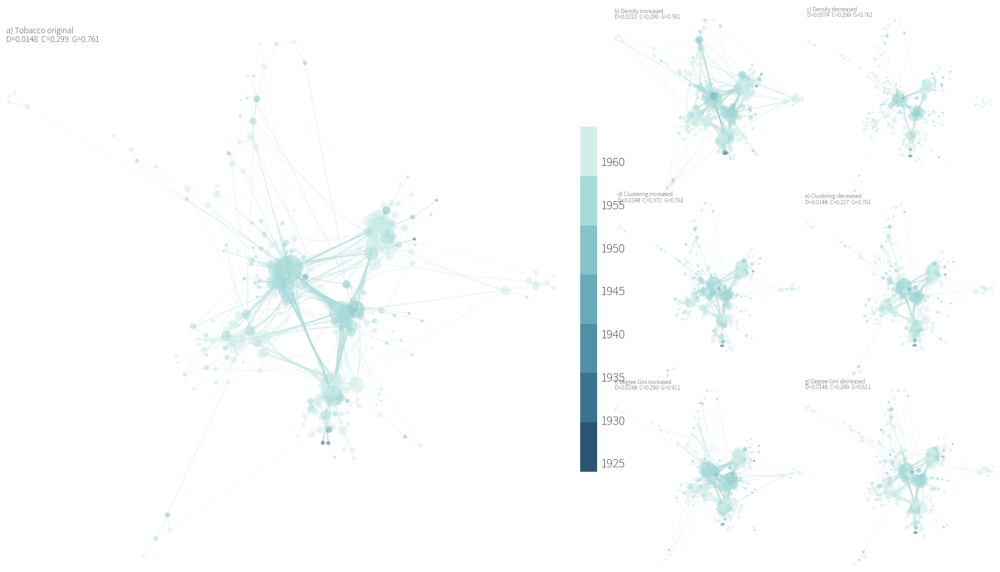

edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Ego Depletion: continuing layout for Density increased from original positions (100 FR iterations, start_temp=0.02).


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Ego Depletion: continuing layout for Density decreased from original positions (100 FR iterations, start_temp=0.02).


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Ego Depletion: continuing layout for Clustering increased from original positions (100 FR iterations, start_temp=0.02).


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Ego Depletion: continuing layout for Clustering decreased from original positions (100 FR iterations, start_temp=0.02).


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Ego Depletion: continuing layout for Degree Gini increased from original positions (100 FR iterations, start_temp=0.02).


edge index g._edge not set so using edge index as ID; set g._edge via g.edges(), or change merge_if_existing to False
edge index g._edge __edge_index__ missing as attribute in ig; using ig edge order for IDs


Ego Depletion: continuing layout for Degree Gini decreased from original positions (100 FR iterations, start_temp=0.02).


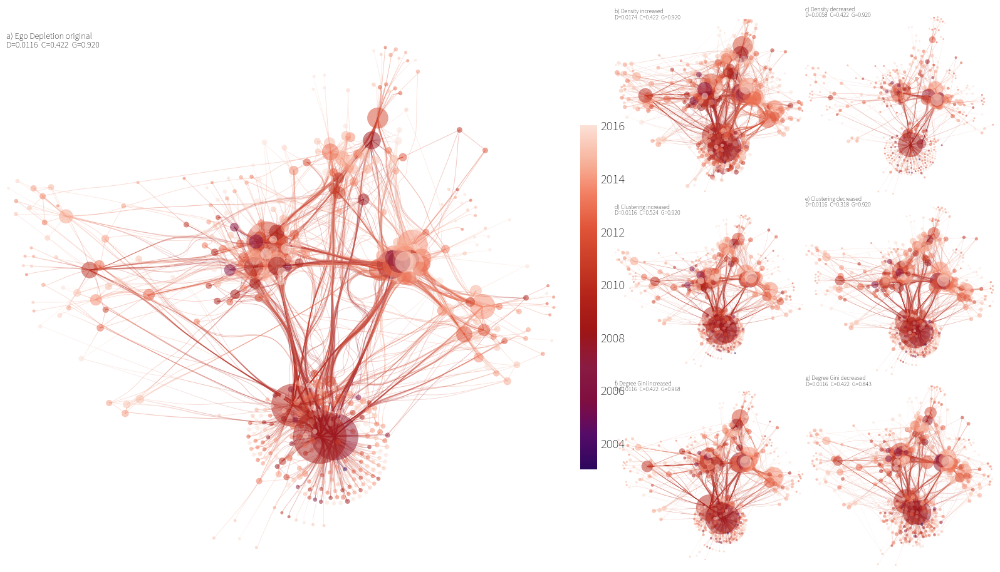

{'pud': {'pdf': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_sa_minmax_facets_oryel_r.pdf'),
  'png': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_sa_minmax_facets_oryel_r.png')},
 'tobacco': {'pdf': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/tobacco_network_sa_minmax_facets_teal_r.pdf'),
  'png': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/tobacco_network_sa_minmax_facets_teal_r.png')},
 'ego_depletion': {'pdf': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/ego_depletion_network_sa_minmax_facets_redp1.pdf'),
  'png': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/ego_depletion_network_sa_minmax_facets_redp1.png')}}

In [11]:
def format_original_label(state, panel_letter="a"):
    prefix = f"{panel_letter}) " if panel_letter is not None else ""
    baseline_row = state["selected_sa_variants"].iloc[0]
    return (
        f"{prefix}{state['display_name']} original\n"
        f"D={baseline_row['sa_baseline_density']:.4f}  "
        f"C={baseline_row['sa_baseline_clustering']:.3f}  "
        f"G={baseline_row['sa_baseline_degree_gini']:.3f}"
    )


def plot_network_minmax_facets(state):
    fig = plt.figure(figsize=(16.0, 9.6))

    left_panel = [0.005, 0.018, 0.600, 0.955]
    right_x0 = 0.612
    small_w = 0.188
    small_gap_x = 0.002
    small_h = 0.300
    small_gap_y = 0.008
    row_tops = [0.665, 0.665 - small_h - small_gap_y, 0.665 - 2 * (small_h + small_gap_y)]
    col_lefts = [right_x0, right_x0 + small_w + small_gap_x]

    ax_original = fig.add_axes(left_panel)
    plot_network_panel(
        ax_original,
        state["G_original"],
        layout_for_graph_for_state(state, state["G_original"]),
        format_original_label(state),
        cmap=state["colormap"],
        norm=state["color_norm"],
        show_colorbar=True,
        title_fontsize=10,
        title_y=0.995,
        node_size_scale=9.0,
        node_size_min=1.2,
        edge_alpha=0.30,
        edge_linewidths=0.65,
        axis_pad=0.004,
    )

    record_lookup = {
        (record["target_stat"], record["direction"]): record
        for record in state["variant_records"]
    }
    direction_order = ["increase", "decrease"]

    for row_idx, target_stat in enumerate(TARGET_STATS):
        for col_idx, direction in enumerate(direction_order):
            record = record_lookup[(target_stat, direction)]
            ax = fig.add_axes([col_lefts[col_idx], row_tops[row_idx], small_w, small_h])
            plot_network_panel(
                ax,
                record["graph"],
                layout_for_record_for_state(state, record),
                record["label"],
                cmap=state["colormap"],
                norm=state["color_norm"],
                title_fontsize=7.0,
                title_y=0.995,
                node_size_scale=3.0,
                node_size_min=0.30,
                edge_alpha=0.23,
                edge_linewidths=0.32,
                axis_pad=0.004,
            )

    out_path = FIGURE_DIR / f"{state['figure_slug']}_sa_minmax_facets_{state['colormap_name']}.pdf"
    out_paths = save_figure_with_png(fig, out_path, dpi=300, bbox_inches="tight", pad_inches=0.01)
    plt.show()
    return fig, out_paths


minmax_facet_outputs = {}
for state in network_states:
    fig, out_path = plot_network_minmax_facets(state)
    minmax_facet_outputs[state["key"]] = out_path

minmax_facet_outputs

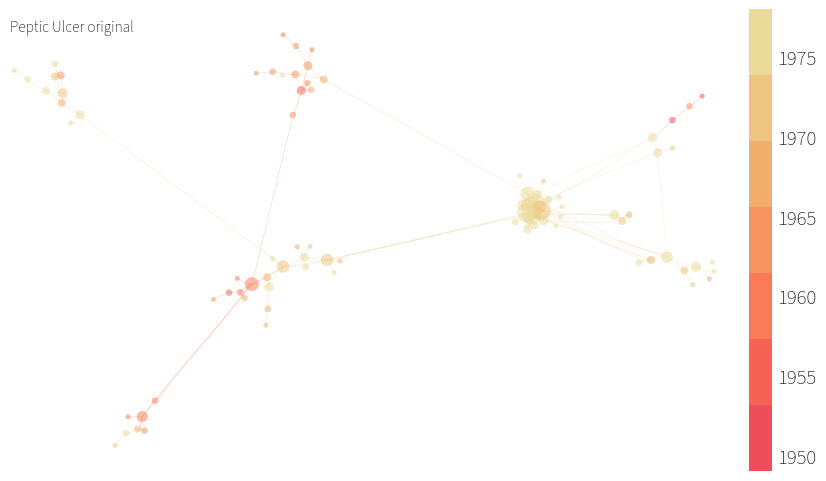

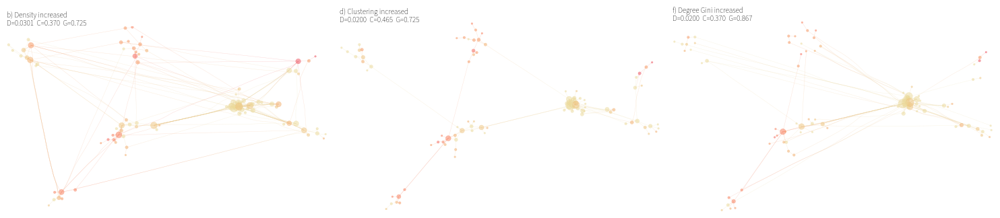

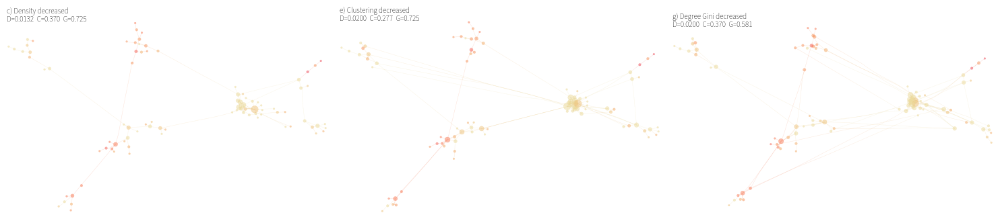

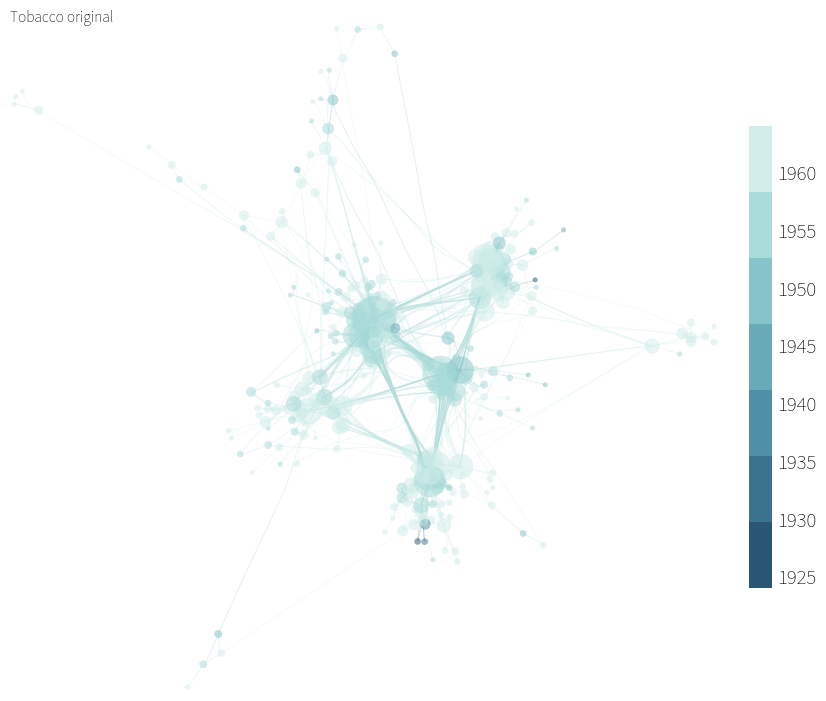

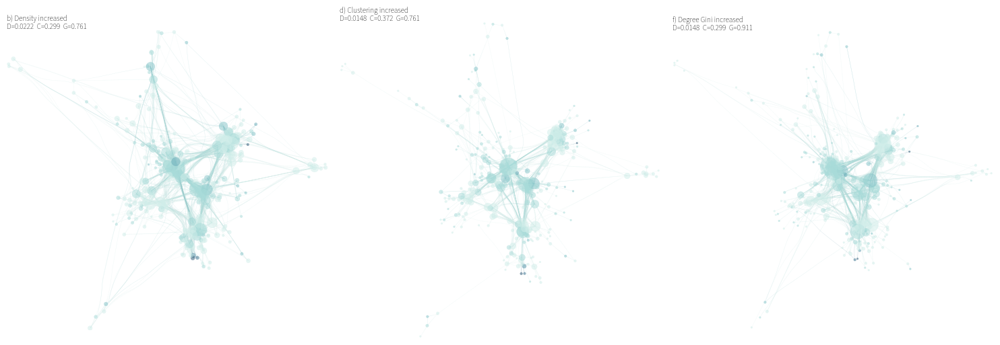

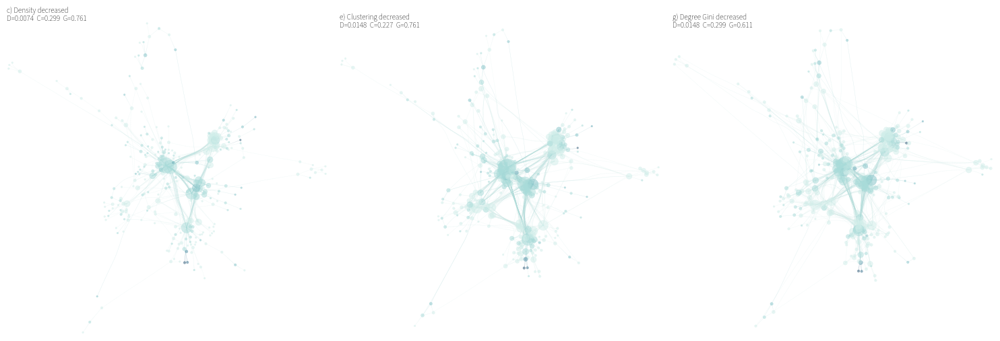

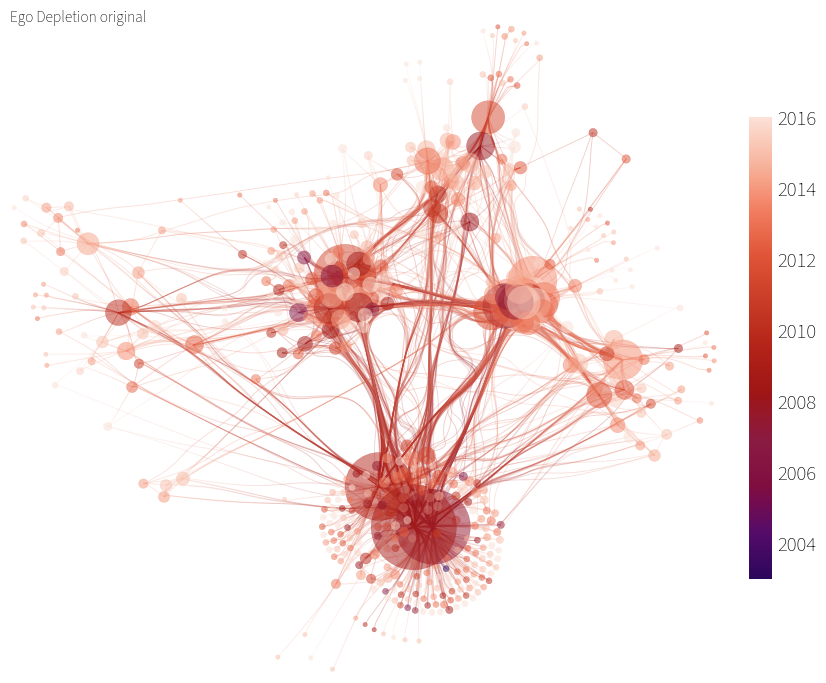

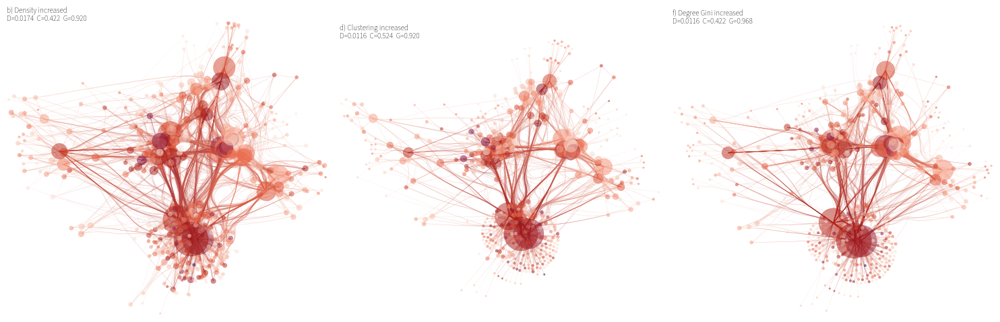

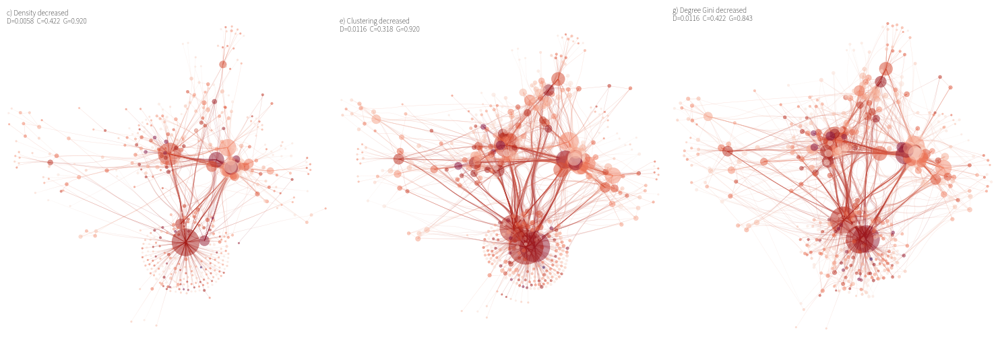

{'pud': [{'pdf': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_original_oryel_r.pdf'),
   'png': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_original_oryel_r.png')},
  {'pdf': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_sa_increased_variants_oryel_r.pdf'),
   'png': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_sa_increased_variants_oryel_r.png')},
  {'pdf': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_sa_decreased_variants_oryel_r.pdf'),
   'png': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_sa_decreased_variants_oryel_r.png')}],
 'tobacco': [{'pdf': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/tob

In [12]:
def plot_network_separate_panels(state):
    output_paths = []

    fig_original, ax_original = plt.subplots(figsize=(10, 10))
    plot_network_panel(
        ax_original,
        state["G_original"],
        layout_for_graph_for_state(state, state["G_original"]),
        f"{state['display_name']} original",
        cmap=state["colormap"],
        norm=state["color_norm"],
        show_colorbar=True,
        title_fontsize=11,
        node_size_scale=9.0,
        node_size_min=1.2,
        edge_linewidths=0.65,
        axis_pad=0.006,
    )
    out_path = FIGURE_DIR / f"{state['figure_slug']}_original_{state['colormap_name']}.pdf"
    out_paths = save_figure_with_png(fig_original, out_path, dpi=300, bbox_inches="tight")
    plt.show()
    output_paths.append(out_paths)

    for direction in ["increase", "decrease"]:
        direction_records = [record for record in state["variant_records"] if record["direction"] == direction]
        fig_variants, axes_variants = plt.subplots(
            1,
            len(direction_records),
            figsize=(5 * len(direction_records), 5.5),
        )
        if len(direction_records) == 1:
            axes_variants = [axes_variants]

        for ax, record in zip(axes_variants, direction_records):
            plot_network_panel(
                ax,
                record["graph"],
                layout_for_record_for_state(state, record),
                record["label"],
                cmap=state["colormap"],
                norm=state["color_norm"],
                title_fontsize=8,
                node_size_scale=3.2,
                node_size_min=0.35,
                edge_linewidths=0.34,
                axis_pad=0.006,
            )

        plt.tight_layout()
        out_path = FIGURE_DIR / f"{state['figure_slug']}_sa_{DIRECTION_LABELS[direction]}_variants_{state['colormap_name']}.pdf"
        out_paths = save_figure_with_png(fig_variants, out_path, dpi=300, bbox_inches="tight")
        plt.show()
        output_paths.append(out_paths)

    return output_paths


separate_panel_outputs = {
    state["key"]: plot_network_separate_panels(state)
    for state in network_states
}
separate_panel_outputs


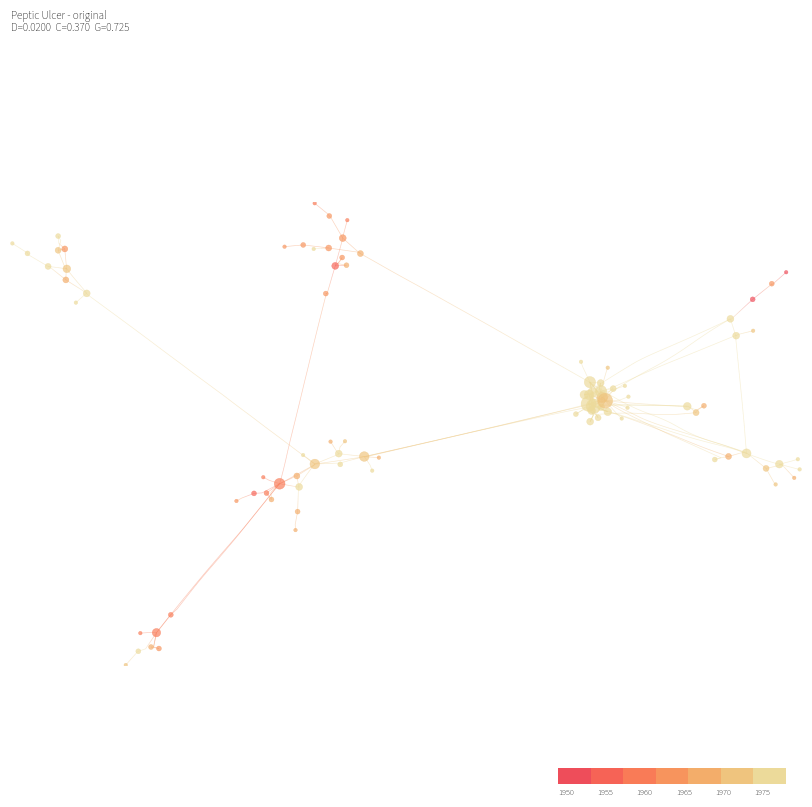

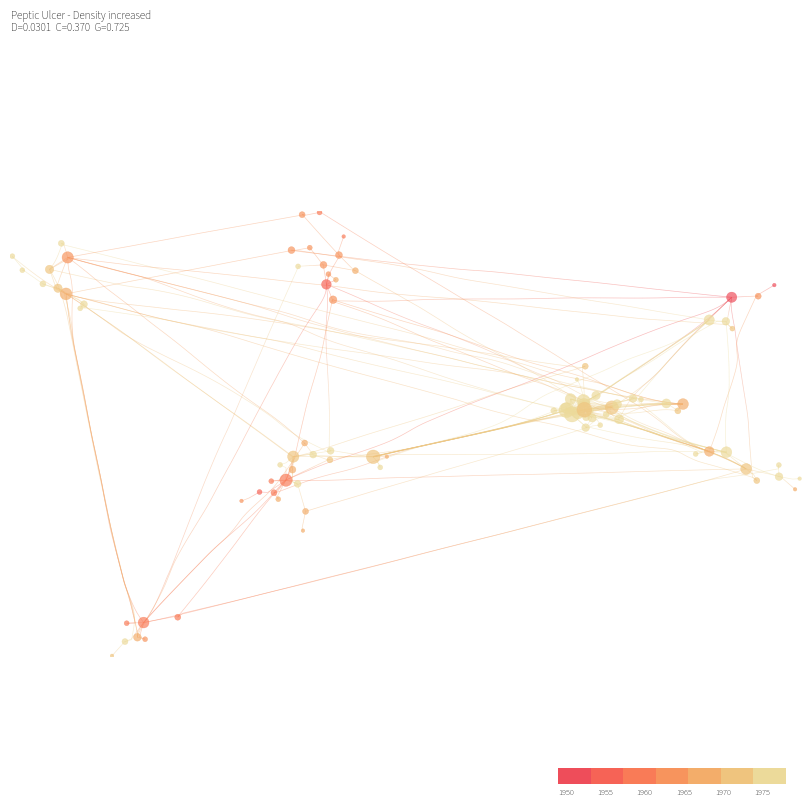

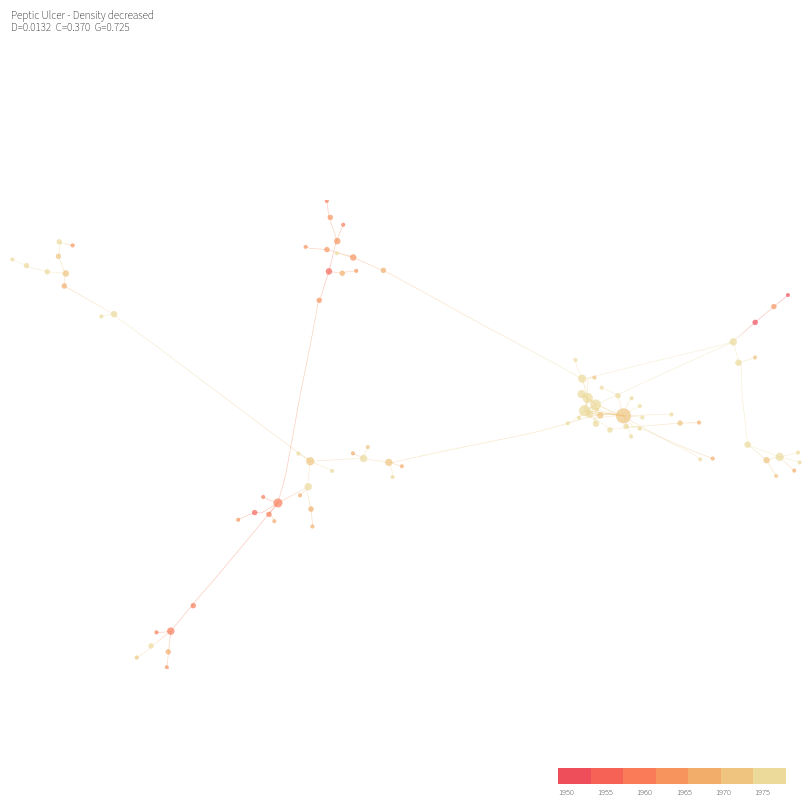

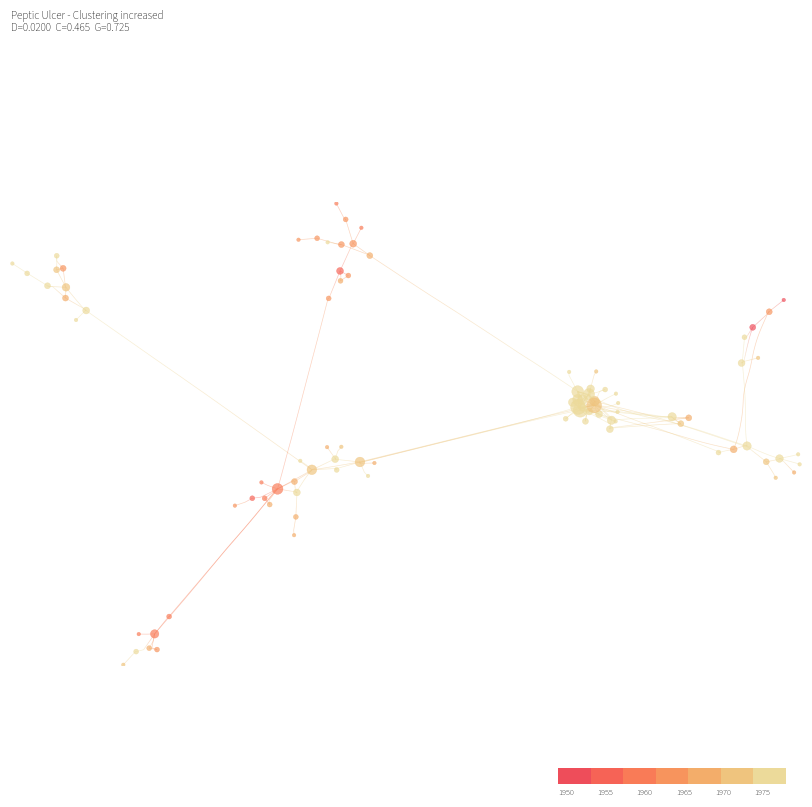

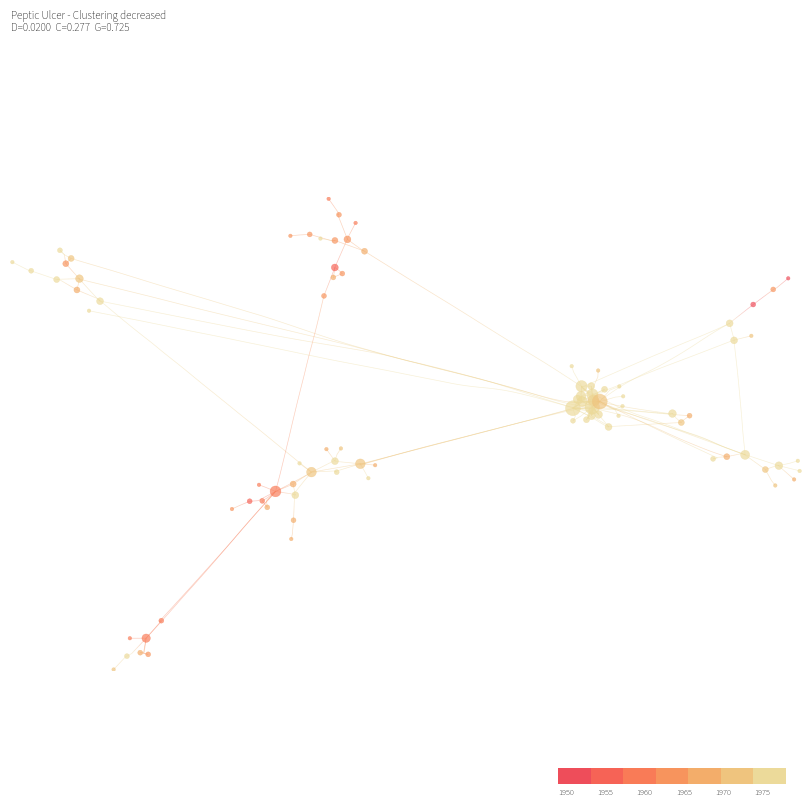

...

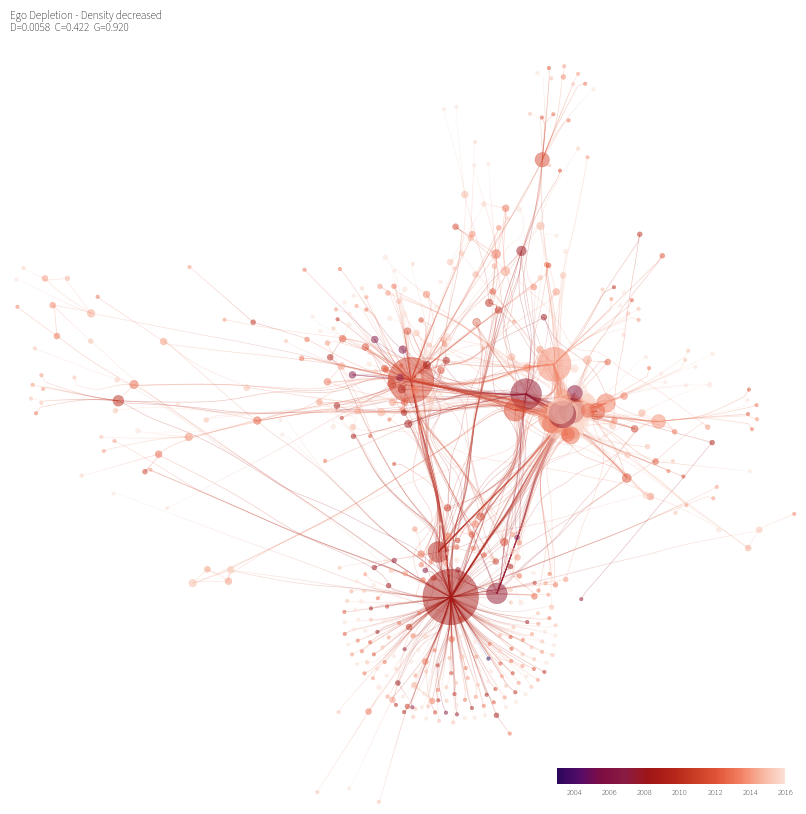

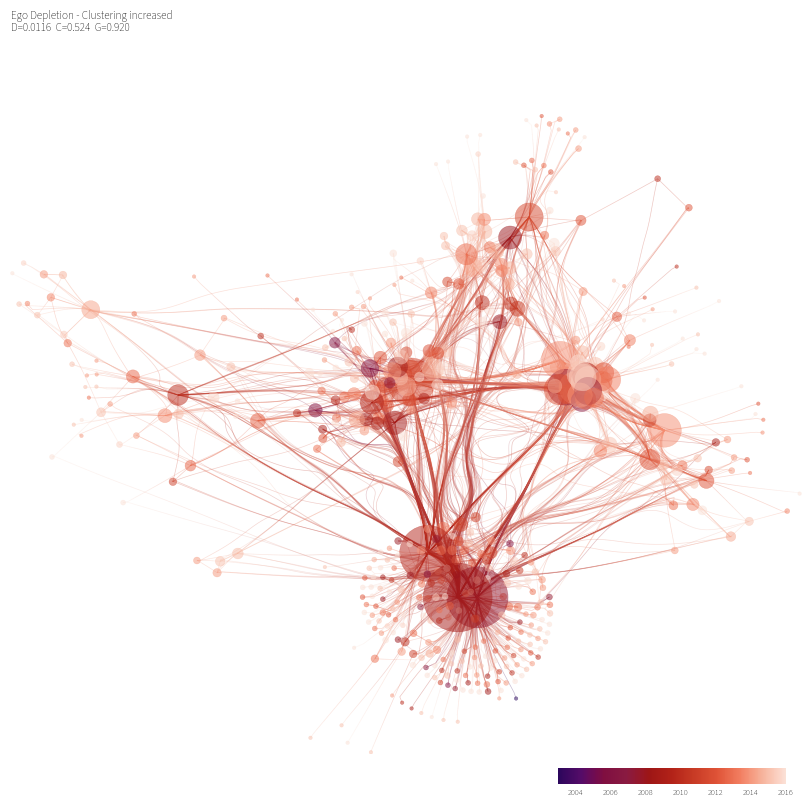

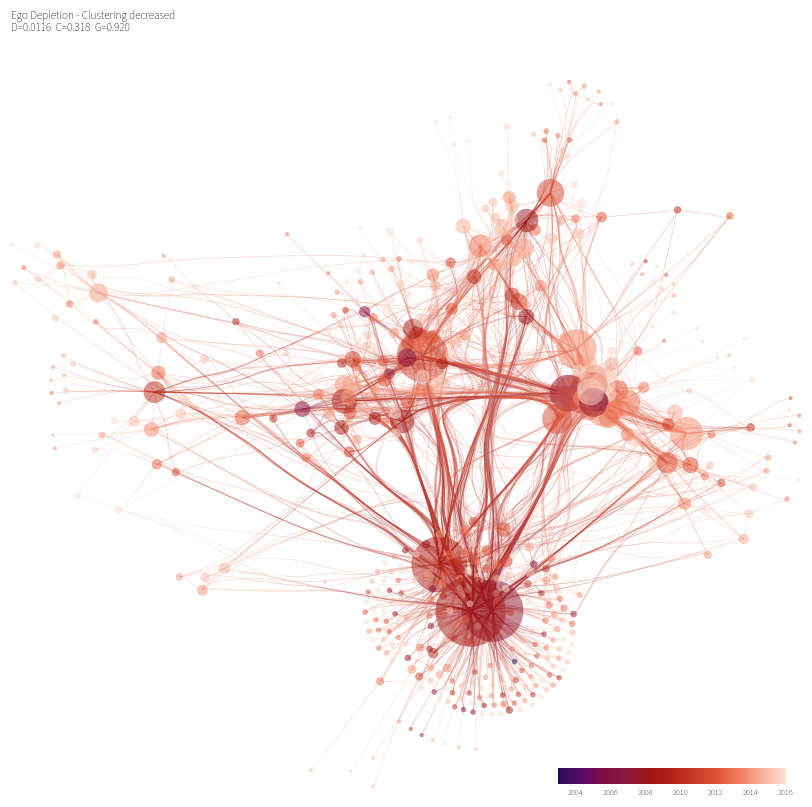

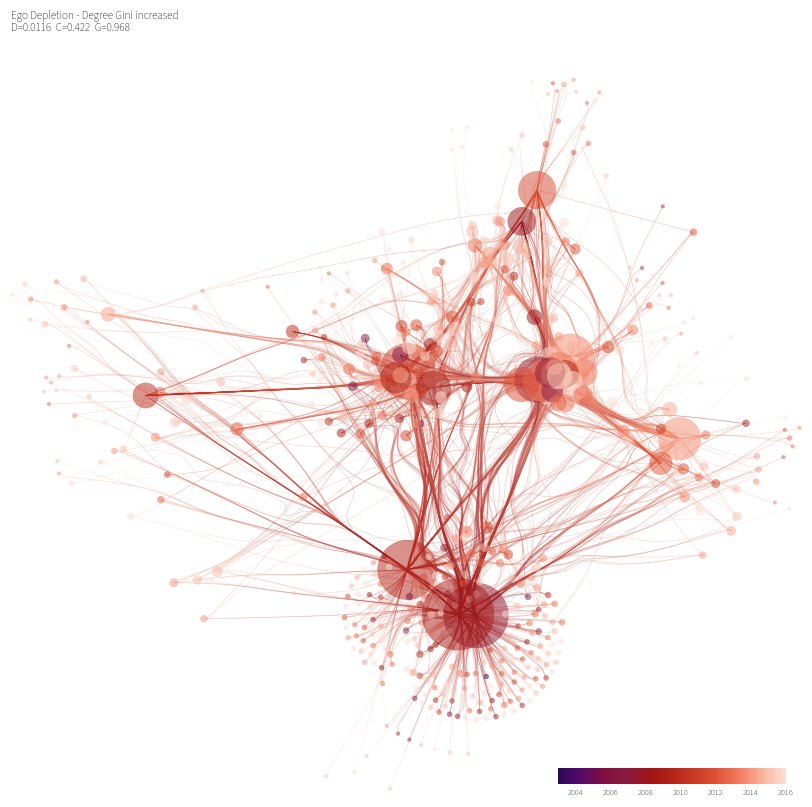

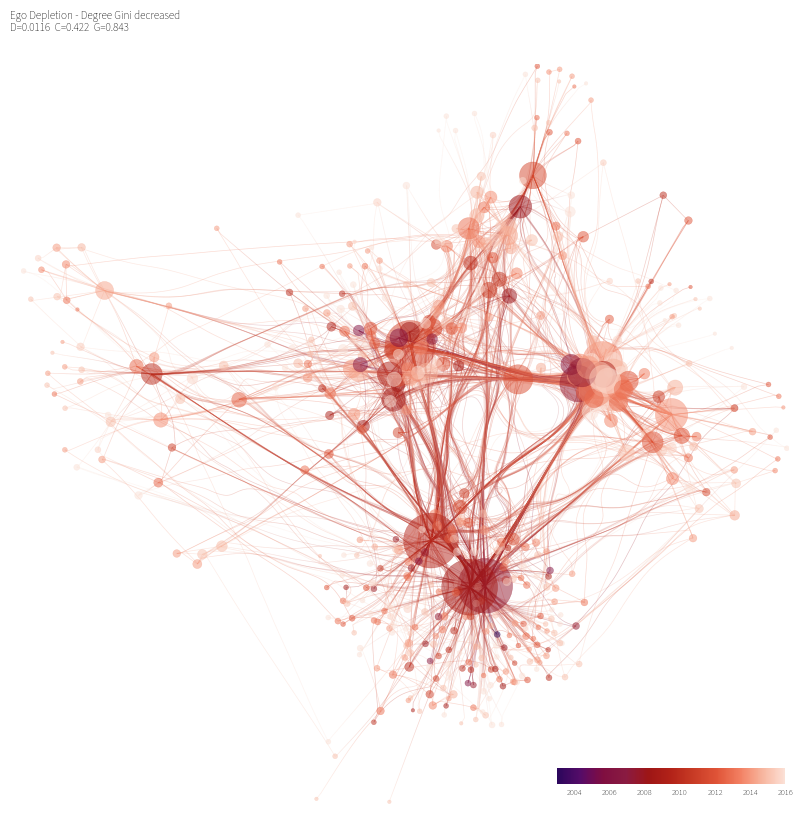

{'pud': [{'pdf': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_baseline_individual_frame_fill_oryel_r.pdf'),
   'png': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_baseline_individual_frame_fill_oryel_r.png')},
  {'pdf': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_density_increased_individual_frame_fill_oryel_r.pdf'),
   'png': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_density_increased_individual_frame_fill_oryel_r.png')},
  {'pdf': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_density_decreased_individual_frame_fill_oryel_r.pdf'),
   'png': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_density_decreased_individual_frame_fill_oryel_r.png')},


In [13]:
def _single_network_name(state):
    return state.get("full_display_name", state["display_name"])


def format_single_original_label(state):
    baseline_row = state["selected_sa_variants"].iloc[0]
    return (
        f"{_single_network_name(state)} - original\n"
        f"D={baseline_row['sa_baseline_density']:.4f}  "
        f"C={baseline_row['sa_baseline_clustering']:.3f}  "
        f"G={baseline_row['sa_baseline_degree_gini']:.3f}"
    )


def format_single_variant_label(state, record):
    variant_label = format_variant_label(record["row"], panel_letter=None)
    first_line, _, rest = variant_label.partition("\n")
    return f"{_single_network_name(state)} - {first_line}\n{rest}"


def network_version_specs_for_state(state):
    specs = [
        {
            "version_slug": "baseline",
            "description": format_single_original_label(state),
            "graph": state["G_original"],
            "layout": layout_for_graph_for_state(state, state["G_original"]),
        }
    ]
    specs.extend(
        {
            "version_slug": f"{record['target_stat']}_{DIRECTION_LABELS[record['direction']]}",
            "description": format_single_variant_label(state, record),
            "graph": record["graph"],
            "layout": layout_for_record_for_state(state, record),
        }
        for record in state["variant_records"]
    )
    return specs


def plot_network_individual_frame_fill(state, spec):
    fig = plt.figure(figsize=(8.0, 8.0))
    ax = fig.add_axes([0.005, 0.005, 0.990, 0.925])
    cbar_ax = fig.add_axes([0.690, 0.030, 0.285, 0.020])
    plot_network_panel(
        ax,
        spec["graph"],
        spec["layout"],
        "",
        cmap=state["colormap"],
        norm=state["color_norm"],
        show_colorbar=True,
        title_fontsize=1,
        title_pad=0,
        node_size_scale=6.0,
        node_size_min=0.7,
        node_alpha=state.get("single_node_alpha", 0.50),
        edge_alpha=state.get("single_edge_alpha", 0.28),
        edge_linewidths=0.48,
        axis_pad=0.003,
        colorbar_orientation="horizontal",
        colorbar_cax=cbar_ax,
        colorbar_tick_labelsize=6,
    )
    fig.text(
        0.006,
        0.998,
        spec["description"],
        ha="left",
        va="top",
        fontsize=8,
        linespacing=1.0,
    )
    out_path = FIGURE_DIR / (
        f"{state['figure_slug']}_{spec['version_slug']}_individual_frame_fill_"
        f"{state['colormap_name']}.pdf"
    )
    out_paths = save_figure_with_png(fig, out_path, dpi=300, bbox_inches="tight", pad_inches=0.005)
    plt.show()
    return fig, out_paths


def plot_all_network_individual_frame_fills(state):
    output_paths = []
    for spec in network_version_specs_for_state(state):
        fig, out_paths = plot_network_individual_frame_fill(state, spec)
        output_paths.append(out_paths)
    return output_paths


individual_frame_fill_outputs = {
    state["key"]: plot_all_network_individual_frame_fills(state)
    for state in network_states
}
individual_frame_fill_outputs


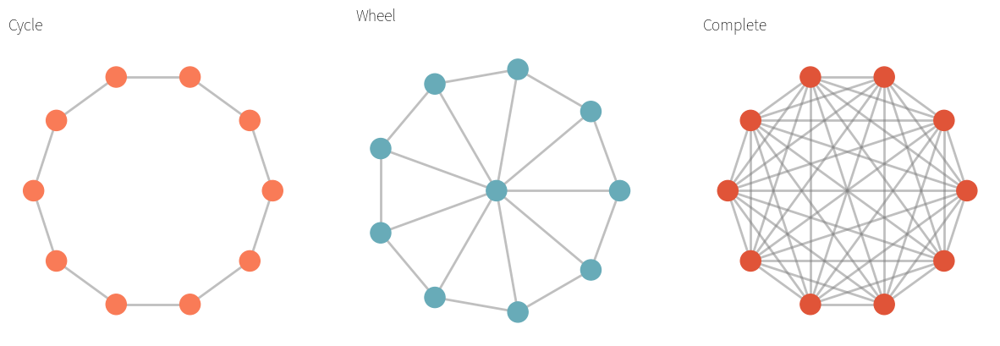

{'pdf': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/basic_network_types_oryel_r_teal_r_redp1.pdf'),
 'png': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/basic_network_types_oryel_r_teal_r_redp1.png')}

In [14]:
# Replicate Figure 2: 10 person cycle, wheel, and complete graph
fig, axes = plt.subplots(1, 3, figsize=(15, 5.2))

# Create the three networks
n = 10

# Cycle graph
G_cycle = nx.cycle_graph(n)
pos_cycle = nx.circular_layout(G_cycle)

# Wheel graph
G_wheel = nx.wheel_graph(n)
# Create circular layout for outer nodes (1 through n)
outer_nodes = list(range(1, n + 1))
pos_wheel = nx.circular_layout(G_wheel.subgraph(outer_nodes))
# Set center node (0) at origin
pos_wheel[0] = np.array([0.0, 0.0])


# Complete graph
G_complete = nx.complete_graph(n)
pos_complete = nx.circular_layout(G_complete)

# Generate random values for nodes
np.random.seed(42)  # For reproducibility
values_cycle = np.full(n, 0.3)
values_wheel = np.full(n, 0.5)
values_complete = np.full(n, 0.7)
network_type_colormaps = {
    "cycle": resolve_colormap(BASIC_NETWORK_TYPE_COLORMAP_NAMES.get("cycle", "oryel_r")),
    "wheel": resolve_colormap(BASIC_NETWORK_TYPE_COLORMAP_NAMES.get("wheel", "teal_r")),
    "complete": resolve_colormap(BASIC_NETWORK_TYPE_COLORMAP_NAMES.get("complete", "redp1")),
}

# Plot cycle
nx.draw_networkx_nodes(G_cycle, pos_cycle, ax=axes[0], node_color=values_cycle, node_size=300, cmap=network_type_colormaps["cycle"], vmin=0, vmax=1)
nx.draw_networkx_edges(G_cycle, pos_cycle, ax=axes[0], edge_color='gray', width=2, alpha=0.5)
# Add invisible scatterplot for all nodes
x_cycle = [pos_cycle[node][0] for node in G_cycle.nodes()]
y_cycle = [pos_cycle[node][1] for node in G_cycle.nodes()]
axes[0].scatter(x_cycle, y_cycle, s=300, alpha=0)
axes[0].set_title("Cycle", fontsize=14)
axes[0].axis('off')
axes[0].set_aspect('equal')

# Plot wheel
nx.draw_networkx_nodes(G_wheel, pos_wheel, ax=axes[1], node_color=values_wheel, node_size=300, cmap=network_type_colormaps["wheel"], vmin=0, vmax=1)
nx.draw_networkx_edges(G_wheel, pos_wheel, ax=axes[1], edge_color='gray', width=2, alpha=0.5)
# Add invisible scatterplot for all nodes
x_wheel = [pos_wheel[node][0] for node in G_wheel.nodes()]
y_wheel = [pos_wheel[node][1] for node in G_wheel.nodes()]
axes[1].scatter(x_wheel, y_wheel, s=300, alpha=0)
axes[1].set_title("Wheel", fontsize=14)
axes[1].axis('off')
axes[1].set_aspect('equal')

# Plot complete
nx.draw_networkx_nodes(G_complete, pos_complete, ax=axes[2], node_color=values_complete, node_size=300, cmap=network_type_colormaps["complete"], vmin=0, vmax=1)
nx.draw_networkx_edges(G_complete, pos_complete, ax=axes[2], edge_color='gray', width=2, alpha=0.5)
# Add invisible scatterplot for all nodes
x_complete = [pos_complete[node][0] for node in G_complete.nodes()]
y_complete = [pos_complete[node][1] for node in G_complete.nodes()]
axes[2].scatter(x_complete, y_complete, s=300, alpha=0)
axes[2].set_title("Complete", fontsize=14)
axes[2].axis('off')
axes[2].set_aspect('equal')

#plt.tight_layout()
basic_network_types_paths = save_figure_with_png(fig, FIGURE_DIR / "basic_network_types_oryel_r_teal_r_redp1.pdf", dpi=300)
plt.show()

basic_network_types_paths


In [15]:
pos_wheel

{1: array([1.00000000e+00, 1.98682148e-08]),
 2: array([0.76604444, 0.64278759]),
 3: array([0.17364823, 0.98480774]),
 4: array([-0.50000005,  0.8660254 ]),
 5: array([-0.9396926 ,  0.34202023]),
 6: array([-0.9396926 , -0.34202013]),
 7: array([-0.4999999 , -0.86602542]),
 8: array([ 0.17364817, -0.9848077 ]),
 9: array([ 0.76604432, -0.64278773]),
 0: array([0., 0.])}

Make all of these only consider out-degrees, including zero-degree nodes.


Degree Distribution Analysis

Peptic Ulcer original:
  Nodes: 90, Edges: 160
  Gini coefficient: 0.7246


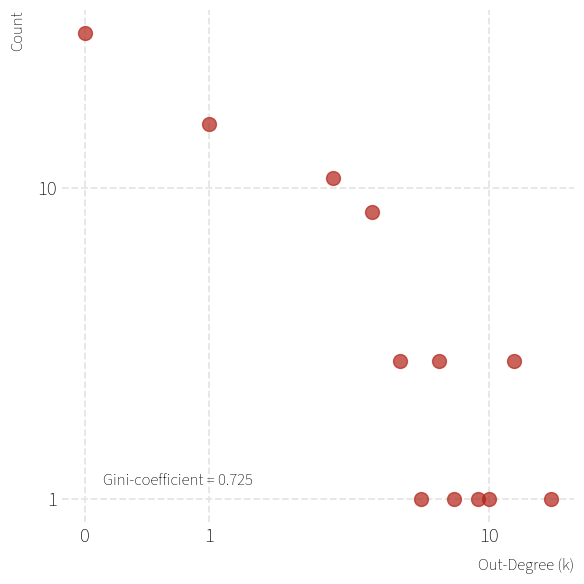

{'pdf': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/degree_distributions_loglog.pdf'),
 'png': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/degree_distributions_loglog.png')}

In [16]:
import numpy as np
from matplotlib.ticker import ScalarFormatter

# Calculate degree distributions for original network only
networks = [
    (f"{current_state["display_name"]} original", G_original),
]

def gini_coefficient(x):
    """Calculate Gini coefficient of a distribution."""
    x = np.array(x, dtype=float)
    # Keep zeros for Gini calculation
    if len(x) == 0:
        return 0
    x = np.sort(x)
    n = len(x)
    cumx = np.cumsum(x)
    if cumx[-1] == 0:
        return 0
    return (n + 1 - 2 * np.sum(cumx) / cumx[-1]) / n


def calculate_degree_gini(G, directed=True):
    """OURS"""
    if directed:
        degrees = [deg for _, deg in G.out_degree()]
    else:
        degrees = [deg for _, deg in G.degree()]
    # Sort the degrees in ascending order
    sorted_x = np.sort(np.array(degrees))
    n = len(np.array(degrees))
    cumx = np.cumsum(sorted_x, dtype=float)
    if cumx[-1] == 0:
        return 0
    gini = (n + 1 - 2 * np.sum(cumx) / cumx[-1]) / n

    return gini



print("=" * 60)
print("Degree Distribution Analysis")
print("=" * 60)

degree_data = {}

for name, G in networks:
    
    # Use out-degree and include all nodes (including 0 degree)
    degrees = [d for n, d in G.out_degree()]
    
    degree_data[name] = degrees
    
    # Gini coefficient
    gini = calculate_degree_gini(G, directed=True)
    
    print(f"\n{name}:")
    print(f"  Nodes: {G.number_of_nodes()}, Edges: {G.number_of_edges()}")
    print(f"  Gini coefficient: {gini:.4f}")

# Plot symlog degree distributions
fig, axes = plt.subplots(1, 1, figsize=(6, 6))

# Get color from COLORMAP at 0.5
point_color = COLORMAP(0.5)

for idx, (name, G) in enumerate(networks):
    ax = axes
    degrees = degree_data[name]
    
    # Calculate degree distribution (including zeros)
    unique_degrees, counts = np.unique(degrees, return_counts=True)
    
    # Plot empirical distribution with larger points (using counts instead of probabilities)
    ax.plot(unique_degrees, counts, 'o', color=point_color, alpha=0.7, label='Empirical', markersize=10)
    
    ax.set_xscale('symlog')
    ax.set_yscale('symlog')
    ax.set_xlabel('Out-Degree (k)', fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
   # ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3)
    
    # Format axes to show real numbers instead of scientific notation
    for axis in [ax.xaxis, ax.yaxis]:
        axis.set_major_formatter(ScalarFormatter())
        axis.set_minor_formatter(ScalarFormatter())
    
    ax.yaxis.set_minor_locator(plt.NullLocator())
    ax.yaxis.set_minor_formatter(plt.NullFormatter())
    ax.grid(True, alpha=1.)
    
    # Add Gini annotation towards the right side center of the plot
    ax.text(0.08, 0.08, f'Gini-coefficient = {gini_coefficient(degrees):.3f}', 
            transform=ax.transAxes, fontsize=12, verticalalignment='center')

plt.tight_layout()
degree_distribution_paths = save_figure_with_png(fig, FIGURE_DIR / "degree_distributions_loglog.pdf", dpi=300)
plt.show()

degree_distribution_paths


Degree Distribution Analysis with Power Law Statistics

Peptic Ulcer original:
  Nodes: 90, Edges: 160
  Density: 0.0200
  Clustering: 0.1639
  Gini coefficient: 0.7246
  Power Law Fit:0%
    Alpha (exponent): 2.1221 +/- 0.2049
    xmin: 2.0
  Comparison Tests (positive R favors power law):
    Power law vs Exponential: R = 0.3451, p = 0.7301
    Power law vs Lognormal: R = -1.1831, p = 0.2368


Assuming nested distributions


    Power law vs Truncated Power Law: R = -1.4925, p = 0.1279
    Lognormal vs Exponential: R = 1.0743, p = 0.2827
    Lognormal vs Truncated Power Law: R = -1.0324, p = 0.3019
  Lognormal Fit:
    mu: 0.0624
    sigma: 1.2327

Density increased:
  Nodes: 90, Edges: 241
  Density: 0.0301
  Clustering: 0.1297
  Gini coefficient: 0.7246
  Power Law Fit:0%
    Alpha (exponent): 6.5683 +/- 1.6074
    xmin: 10.0
  Comparison Tests (positive R favors power law):
    Power law vs Exponential: R = 0.7345, p = 0.4627
    Power law vs Lognormal: R = -1.1025, p = 0.2702


/Users/Noich001/miniforge3/envs/EM_predictions/lib/python3.12/site-packages/powerlaw.py:1570: RuntimeWarning: invalid value encountered in divide
  return likelihoods/norm
Assuming nested distributions


    Power law vs Truncated Power Law: R = -0.0513, p = 0.9135
    Lognormal vs Exponential: R = 1.0855, p = 0.2777
    Lognormal vs Truncated Power Law: R = 1.0180, p = 0.3087
  Lognormal Fit:
    mu: -247.3983
    sigma: 6.6443

Density decreased:
  Nodes: 90, Edges: 106
  Density: 0.0132
  Clustering: 0.0387
  Gini coefficient: 0.7245
  Power Law Fit:5%
    Alpha (exponent): 2.2326 +/- 0.2828
    xmin: 2.0
  Comparison Tests (positive R favors power law):
    Power law vs Exponential: R = 0.2446, p = 0.8068
    Power law vs Lognormal: R = -0.7586, p = 0.4481


Assuming nested distributions


    Power law vs Truncated Power Law: R = -0.9333, p = 0.2769
    Lognormal vs Exponential: R = 0.7206, p = 0.4712
    Lognormal vs Truncated Power Law: R = -0.2732, p = 0.7847
  Lognormal Fit:
    mu: 0.0377
    sigma: 1.1375

Clustering increased:
  Nodes: 90, Edges: 160
  Density: 0.0200
  Clustering: 0.1768
  Gini coefficient: 0.7246
  Power Law Fit:0%
    Alpha (exponent): 2.1211 +/- 0.2047
    xmin: 2.0
  Comparison Tests (positive R favors power law):
    Power law vs Exponential: R = 0.3209, p = 0.7483
    Power law vs Lognormal: R = -1.1732, p = 0.2407


Assuming nested distributions


    Power law vs Truncated Power Law: R = -1.5058, p = 0.1249
    Lognormal vs Exponential: R = 1.1145, p = 0.2650
    Lognormal vs Truncated Power Law: R = -0.8034, p = 0.4217
  Lognormal Fit:
    mu: 0.1433
    sigma: 1.2024

Clustering decreased:
  Nodes: 90, Edges: 160
  Density: 0.0200
  Clustering: 0.1399
  Gini coefficient: 0.7246
  Power Law Fit:0%
    Alpha (exponent): 2.1221 +/- 0.2049
    xmin: 2.0
  Comparison Tests (positive R favors power law):
    Power law vs Exponential: R = 0.3451, p = 0.7301
    Power law vs Lognormal: R = -1.1831, p = 0.2368


Assuming nested distributions


    Power law vs Truncated Power Law: R = -1.4925, p = 0.1279
    Lognormal vs Exponential: R = 1.0743, p = 0.2827
    Lognormal vs Truncated Power Law: R = -1.0324, p = 0.3019
  Lognormal Fit:
    mu: 0.0624
    sigma: 1.2327

Degree Gini increased:
  Nodes: 90, Edges: 160
  Density: 0.0200
  Clustering: 0.0944
  Gini coefficient: 0.8669
  Power Law Fit:0%
    Alpha (exponent): 1.5808 +/- 0.1079
    xmin: 1.0
  Comparison Tests (positive R favors power law):
    Power law vs Exponential: R = 0.9752, p = 0.3295
    Power law vs Lognormal: R = -2.1316, p = 0.0330


Assuming nested distributions


    Power law vs Truncated Power Law: R = -2.2362, p = 0.0313
    Lognormal vs Exponential: R = 1.6222, p = 0.1048
    Lognormal vs Truncated Power Law: R = -1.7680, p = 0.0771
  Lognormal Fit:
    mu: -0.3948
    sigma: 1.9221

Degree Gini decreased:
  Nodes: 90, Edges: 160
  Density: 0.0200
  Clustering: 0.1491
  Gini coefficient: 0.5806
  Power Law Fit:7%
    Alpha (exponent): 2.3395 +/- 0.2368
    xmin: 2.0
  Comparison Tests (positive R favors power law):
    Power law vs Exponential: R = 0.9669, p = 0.3336
    Power law vs Lognormal: R = -1.2649, p = 0.2059


Assuming nested distributions


    Power law vs Truncated Power Law: R = -1.6522, p = 0.2778
    Lognormal vs Exponential: R = 1.2413, p = 0.2145
    Lognormal vs Truncated Power Law: R = -1.0539, p = 0.2919
  Lognormal Fit:
    mu: -2.1277
    sigma: 1.6448


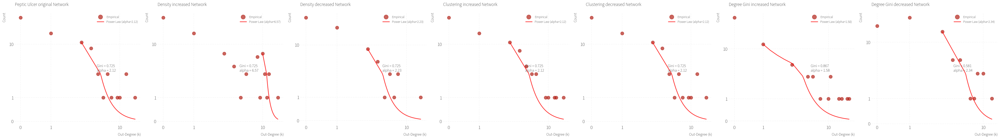

{'pdf': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_degree_distributions_all_sa_networks_loglog.pdf'),
 'png': PosixPath('/Users/Noich001/Desktop/network_inequality_current/e_network_inequality/Figures/pud_network_degree_distributions_all_sa_networks_loglog.png')}

In [17]:
import powerlaw
import numpy as np
from matplotlib.ticker import ScalarFormatter

# Calculate degree distributions for the original network and loaded SA variants
networks = [(f"{current_state["display_name"]} original", G_original)] + [
    (record["short_label"], record["graph"])
    for record in variant_records
]


def gini_coefficient(x):
    """Calculate Gini coefficient of a distribution."""
    x = np.array(x, dtype=float)
    if len(x) == 0:
        return 0
    x = np.sort(x)
    n = len(x)
    cumx = np.cumsum(x)
    if cumx[-1] == 0:
        return 0
    return (n + 1 - 2 * np.sum(cumx) / cumx[-1]) / n


def calculate_degree_gini(G, directed=True):
    """Calculate Gini coefficient for degree distribution."""
    if directed:
        degrees = [deg for _, deg in G.out_degree()]
    else:
        degrees = [deg for _, deg in G.degree()]
    sorted_x = np.sort(np.array(degrees))
    n = len(np.array(degrees))
    cumx = np.cumsum(sorted_x, dtype=float)
    if cumx[-1] == 0:
        return 0
    gini = (n + 1 - 2 * np.sum(cumx) / cumx[-1]) / n
    return gini


print("=" * 60)
print("Degree Distribution Analysis with Power Law Statistics")
print("=" * 60)

degree_data = {}
powerlaw_results = {}

for name, G in networks:
    # Use out-degree and include all nodes (including 0 degree)
    degrees = [d for n, d in G.out_degree()]
    degree_data[name] = degrees

    # Gini coefficient
    gini = calculate_degree_gini(G, directed=True)

    # Power law analysis (filter out zeros for powerlaw package)
    degrees_nonzero = [d for d in degrees if d > 0]

    print(f"\n{name}:")
    print(f"  Nodes: {G.number_of_nodes()}, Edges: {G.number_of_edges()}")
    print(f"  Density: {nx.density(G):.4f}")
    print(f"  Clustering: {nx.average_clustering(G):.4f}")
    print(f"  Gini coefficient: {gini:.4f}")

    if len(degrees_nonzero) > 0:
        # Fit power law
        fit = powerlaw.Fit(degrees_nonzero, discrete=True, verbose=False)

        # Store results
        powerlaw_results[name] = {
            'fit': fit,
            'alpha': fit.power_law.alpha,
            'xmin': fit.power_law.xmin,
            'sigma': fit.power_law.sigma,
        }

        print(f"  Power Law Fit:")
        print(f"    Alpha (exponent): {fit.power_law.alpha:.4f} +/- {fit.power_law.sigma:.4f}")
        print(f"    xmin: {fit.power_law.xmin}")

        # Compare power law to alternatives
        R_exp, p_exp = fit.distribution_compare('power_law', 'exponential', normalized_ratio=True)
        print(f"  Comparison Tests (positive R favors power law):")
        print(f"    Power law vs Exponential: R = {R_exp:.4f}, p = {p_exp:.4f}")

        R_ln, p_ln = fit.distribution_compare('power_law', 'lognormal', normalized_ratio=True)
        print(f"    Power law vs Lognormal: R = {R_ln:.4f}, p = {p_ln:.4f}")

        R_tpl, p_tpl = fit.distribution_compare('power_law', 'truncated_power_law', normalized_ratio=True)
        print(f"    Power law vs Truncated Power Law: R = {R_tpl:.4f}, p = {p_tpl:.4f}")

        R_ln_exp, p_ln_exp = fit.distribution_compare('lognormal', 'exponential', normalized_ratio=True)
        print(f"    Lognormal vs Exponential: R = {R_ln_exp:.4f}, p = {p_ln_exp:.4f}")

        R_ln_tpl, p_ln_tpl = fit.distribution_compare('lognormal', 'truncated_power_law', normalized_ratio=True)
        print(f"    Lognormal vs Truncated Power Law: R = {R_ln_tpl:.4f}, p = {p_ln_tpl:.4f}")

        if fit.lognormal is not None:
            print(f"  Lognormal Fit:")
            print(f"    mu: {fit.lognormal.mu:.4f}")
            print(f"    sigma: {fit.lognormal.sigma:.4f}")

        powerlaw_results[name]['comparisons'] = {
            'exponential': (R_exp, p_exp),
            'lognormal': (R_ln, p_ln),
            'truncated_power_law': (R_tpl, p_tpl),
            'lognormal_vs_exponential': (R_ln_exp, p_ln_exp),
            'lognormal_vs_truncated_power_law': (R_ln_tpl, p_ln_tpl),
        }

# Plot degree distributions for all networks
fig, axes = plt.subplots(1, len(networks), figsize=(6 * len(networks), 6))
if len(networks) == 1:
    axes = [axes]

point_color = COLORMAP(0.5)
powerlaw_color = 'red'

for idx, (name, G) in enumerate(networks):
    ax = axes[idx]
    degrees = degree_data[name]

    unique_degrees, counts = np.unique(degrees, return_counts=True)
    ax.plot(unique_degrees, counts, 'o', color=point_color, alpha=0.7, label='Empirical', markersize=10)

    if name in powerlaw_results:
        fit = powerlaw_results[name]['fit']
        alpha = powerlaw_results[name]['alpha']
        xmin = powerlaw_results[name]['xmin']
        x_powerlaw = np.linspace(xmin, max(degrees), 100)

        degrees_above_xmin = unique_degrees[unique_degrees >= xmin]
        counts_above_xmin = counts[unique_degrees >= xmin]

        if len(degrees_above_xmin) > 0:
            C = counts_above_xmin[0] * (degrees_above_xmin[0] ** alpha)
            y_powerlaw = C * (x_powerlaw ** (-alpha))
            ax.plot(
                x_powerlaw,
                y_powerlaw,
                '-',
                color=powerlaw_color,
                linewidth=2,
                label=f'Power Law (alpha={alpha:.2f})',
                alpha=0.8,
            )

    ax.set_xscale('symlog')
    ax.set_yscale('symlog')
    ax.set_xlabel('Out-Degree (k)', fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    ax.set_title(f'{name} Network', fontsize=14)
    ax.legend(fontsize=10, loc='upper right')
    ax.grid(True, alpha=0.3)

    for axis in [ax.xaxis, ax.yaxis]:
        axis.set_major_formatter(ScalarFormatter())
        axis.set_minor_formatter(ScalarFormatter())

    ax.yaxis.set_minor_locator(plt.NullLocator())
    ax.yaxis.set_minor_formatter(plt.NullFormatter())

    gini = gini_coefficient(degrees)
    annotation_text = f'Gini = {gini:.3f}'
    if name in powerlaw_results:
        alpha = powerlaw_results[name]['alpha']
        annotation_text += f'\nalpha = {alpha:.2f}'

    ax.text(0.65, 0.5, annotation_text, transform=ax.transAxes, fontsize=12, verticalalignment='center')

plt.tight_layout()
degree_distribution_all_paths = save_figure_with_png(fig, FIGURE_DIR / f"{current_state["figure_slug"]}_degree_distributions_all_sa_networks_loglog.pdf", dpi=300, bbox_inches="tight")
plt.show()

degree_distribution_all_paths


In [18]:
# Print nodes with highest out degree for each network
for name, G in [(current_state["display_name"], G_original)]:
    out_degrees = dict(G.out_degree())
    sorted_nodes = sorted(out_degrees.items(), key=lambda x: x[1], reverse=True)
    print(f"\n{name} Network - Top 10 nodes by out-degree:")
    for node, degree in sorted_nodes[:10]:
        print(f"  {node}: {degree}")



Peptic Ulcer Network - Top 10 nodes by out-degree:
  https://openalex.org/A5112179199: 19
  https://openalex.org/A5109973380: 13
  https://openalex.org/A5112766937: 13
  https://openalex.org/A5091680206: 10
  https://openalex.org/A5112081192: 9
  https://openalex.org/A5074889787: 7
  https://openalex.org/A5030391668: 6
  https://openalex.org/A5039534603: 6
  https://openalex.org/A5109168274: 5
  https://openalex.org/A5035028240: 4
